# Model A — Segmentation Rasterization 시행착오 / 리뷰 노트북

이 파일은 기존 `segmentation-task.ipynb`의 코드를 삭제하지 않고, **실제로 고민하고 실험한 순서대로 재배치한 리뷰용 사본**이다.

목적은 나중에 다시 복귀했을 때:

> “왜 이 코드를 만들었지?”  
> “왜 dotted 방식은 버렸지?”  
> “Seg와 Vector 관계를 어떻게 정리했지?”

를 다시 처음부터 추론하지 않도록 하는 것이다.

---

## 이 노트북을 읽는 순서

```text
1. Kaggle에서 첫 1장 rasterize
2. traffic_lane이 모두 연속선이 되는 문제 인식
3. 원본 lane annotation 구조 조사
4. v1에서 빠졌던 lane_type을 v2에서 복구
5. 로컬 VS Code/Jupyter로 이동
6. dotted를 고정 dash/gap으로 그리는 실험
7. 실제 dash를 잘못 끊는 문제 발견 → 실패
8. dotted annotation을 원본과 확대 비교
9. Seg / Vector / Geometry Builder의 역할을 다시 정리
10. 현재 잠정 rasterize 기준 정리
11. 다음 작업
```

> ⚠️ 과거 Kaggle 경로(`/kaggle/input/...`) 코드는 **시행착오 보존용**이다.  
> 현재 로컬에서 그대로 `Run All` 하는 용도의 Notebook은 아니다.


## ✅ 현재 이 Notebook의 실행 원칙

이 파일은 이제 **태건 Segmentation의 메인 실험/리뷰 Notebook**으로 사용한다.

### 실행 가능한 Code Cell
현재 로컬 프로젝트에서 실제로 다시 실행할 가치가 있는 코드만 Code Cell로 남겨둔다.

```text
.venv / package 확인
        ↓
PROJECT_ROOT / IMAGE_DIR / JSONL_PATH 설정
        ↓
v2 데이터 상태 확인
        ↓
13883084.jpg annotation 확인
        ↓
현재 기준 lane-flow / stop_line / crosswalk Rasterization
        ↓
앞으로 추가할 검증 실험
```

### 과거 코드
아래에 나오는:

- Kaggle 절대경로 코드
- 실패한 dotted 고정 dash/gap 코드
- 결론이 끝난 dotted EDA
- Kaggle 기본 scaffold

는 **Markdown 안의 Python 코드블록으로만 보존**한다.

따라서 이 Notebook에서 `Restart Kernel → Run All`을 하더라도 과거 실험이 다시 실행되어 현재 흐름을 깨뜨리지 않는다.

> 과거 코드가 Markdown으로 바뀌었다고 삭제된 것은 아니다. 코드와 당시 text/image output을 가능한 범위에서 그대로 기록해두었다.


# 1. 초기 단계 — Kaggle에서 1장만 Rasterize

처음 목표는 단순했다.

```text
traffic_lane → polyline
stop_line    → polyline
crosswalk    → polygon
```

을 pixel mask로 바꾼 뒤 원본 이미지에 overlay하여 annotation이 정상적으로 올라가는지 확인하는 것이었다.

당시에는 `solid / dotted`를 별도로 고려하지 않고 모든 `traffic_lane`을 동일한 polyline으로 처리했다.

> 아래 코드는 **초기 Kaggle 실험 당시 코드**이므로 로컬 경로와 맞지 않을 수 있다.


### 당시 실행 코드 — Kaggle에서 먼저 한 장만 Rasterize

아래 기록은 최초 `13883084.jpg` 한 장으로 rasterization을 확인했던 과정이다.
현재 로컬 실행 코드는 뒤의 **「10. 현재 기준 Rasterization 코드」**를 사용한다.


### 과거 Kaggle 코드 ① — 13883084 annotation 로드

Kaggle 절대경로를 사용하던 초기 코드다. 현재 로컬에서는 `JSONL_PATH`가 이 위치에서 정의되지 않아 오류가 난다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


# ============================================================
# 테스트할 이미지
# ============================================================

TEST_FILE = "13883084.jpg"

IMAGE_PATH = (
    "/kaggle/input/datasets/ltg2757/"
    "segmentation-task-image/"
    + TEST_FILE
)

print("이미지:", IMAGE_PATH)
print("JSONL :", JSONL_PATH)

assert os.path.isfile(IMAGE_PATH), "이미지 파일을 찾을 수 없습니다."
assert os.path.isfile(JSONL_PATH), "JSONL 파일을 찾을 수 없습니다."


# ============================================================
# 해당 이미지 annotation만 가져오기
# ============================================================

annotations = []

with open(JSONL_PATH, "r", encoding="utf-8") as f:
    for line in f:

        ann = json.loads(line)

        if ann["file_name"] == TEST_FILE:
            annotations.append(ann)


print("annotation 개수:", len(annotations))

for ann in annotations:
    print(
        ann["class"],
        ann["category"],
        "points =", len(ann["data"])
    )
```

**당시 출력 기록**

```text
이미지: /kaggle/input/datasets/ltg2757/segmentation-task-image/13883084.jpg
```

**당시 오류 기록**

```text
NameError: name 'JSONL_PATH' is not defined
```


### 과거 Kaggle 코드 ② — 최초 Rasterization

traffic_lane / stop_line / crosswalk을 처음 rasterize했던 코드다. 현재 방식의 출발점이지만, 이 셀 자체는 앞선 Kaggle 환경 변수에 의존한다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
# 원본 이미지 읽기
image = cv2.imread(IMAGE_PATH)

assert image is not None, "이미지를 읽지 못했습니다."

H, W = image.shape[:2]

print("실제 이미지 크기:", H, W)


# ------------------------------------------------------------
# 클래스별 mask
# ------------------------------------------------------------

lane_mask = np.zeros((H, W), dtype=np.uint8)
stop_mask = np.zeros((H, W), dtype=np.uint8)
crosswalk_mask = np.zeros((H, W), dtype=np.uint8)


# ------------------------------------------------------------
# 임시 rasterization 두께
#
# 주의:
# 이 값은 annotation의 정답값이 아니라 우리가 정한 임시값
# ------------------------------------------------------------

LANE_THICKNESS = 8
STOP_THICKNESS = 12


for ann in annotations:

    cls = ann["class"]
    category = ann["category"]

    points = np.array(
        [
            [point["x"], point["y"]]
            for point in ann["data"]
        ],
        dtype=np.int32
    )

    # 점이 없으면 제외
    if len(points) == 0:
        continue


    # --------------------------------------------------------
    # 이미지 바깥 좌표 방지
    # --------------------------------------------------------

    points[:, 0] = np.clip(
        points[:, 0],
        0,
        W - 1
    )

    points[:, 1] = np.clip(
        points[:, 1],
        0,
        H - 1
    )


    # OpenCV 형식
    points_cv = points.reshape(-1, 1, 2)


    # --------------------------------------------------------
    # traffic_lane
    # --------------------------------------------------------

    if cls == "traffic_lane" and category == "polyline":

        if len(points) < 2:
            continue

        cv2.polylines(
            lane_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=LANE_THICKNESS,
            lineType=cv2.LINE_8
        )


    # --------------------------------------------------------
    # stop_line
    # --------------------------------------------------------

    elif cls == "stop_line" and category == "polyline":

        if len(points) < 2:
            continue

        cv2.polylines(
            stop_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=STOP_THICKNESS,
            lineType=cv2.LINE_8
        )


    # --------------------------------------------------------
    # crosswalk
    # --------------------------------------------------------

    elif cls == "crosswalk" and category == "polygon":

        # polygon은 최소 점 3개 필요
        if len(points) < 3:
            continue

        cv2.fillPoly(
            crosswalk_mask,
            [points_cv],
            color=255
        )


print("lane pixels      :", np.count_nonzero(lane_mask))
print("stop pixels      :", np.count_nonzero(stop_mask))
print("crosswalk pixels :", np.count_nonzero(crosswalk_mask))
```

**당시 출력 기록**

```text
실제 이미지 크기: 1080 1920
lane pixels      : 33486
stop pixels      : 0
crosswalk pixels : 0
```


### 과거 Kaggle 코드 ③ — 최초 Overlay

최초 rasterization 결과를 원본 RGB 위에 overlay한 코드와 당시 시각화 결과다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
# OpenCV BGR → matplotlib RGB
image_rgb = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)


# segmentation 표시용 RGB 이미지
seg_color = np.zeros(
    (H, W, 3),
    dtype=np.uint8
)

# lane = 빨강
seg_color[lane_mask > 0] = [255, 0, 0]

# stop line = 초록
seg_color[stop_mask > 0] = [0, 255, 0]

# crosswalk = 파랑
seg_color[crosswalk_mask > 0] = [0, 0, 255]


# 원본 + segmentation overlay
overlay = cv2.addWeighted(
    image_rgb,
    0.7,
    seg_color,
    0.6,
    0
)


plt.figure(figsize=(18, 10))

plt.imshow(overlay)

plt.title(
    "Red = traffic_lane | "
    "Green = stop_line | "
    "Blue = crosswalk"
)

plt.axis("off")

plt.show()
```

**당시 시각화 결과 1**

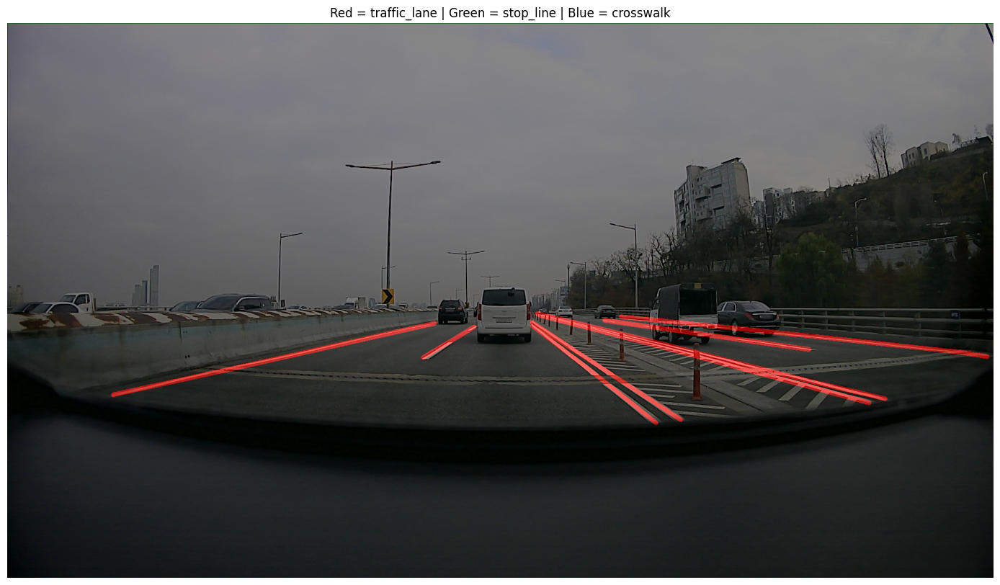


## 1차 결과 / 문제 발견

기본 rasterization 자체는 동작했다.

- `traffic_lane` → 빨강
- `stop_line` → 초록
- `crosswalk` → 파랑

그런데 원본을 보면서 중요한 의문이 생겼다.

### 문제

실제 도로에는:

```text
solid
━━━━━━━━━━━━━━━━

dotted
━━━━      ━━━━      ━━━━
```

가 존재하는데, 현재 코드는 모든 `traffic_lane`을:

```python
cv2.polylines(...)
```

로 연결하기 때문에 **dotted도 연속선처럼 표현**한다.

처음에는 “Segmentation이면 그냥 lane 하나로 퉁쳐도 되지 않나?”라고 생각했지만,  
Vector/BEV까지 연결해서 생각하면 dotted/solid 정보가 의미가 있을 수 있으므로 annotation 구조를 먼저 조사하기로 했다.


# 2. traffic_lane annotation 자체를 원본 위에서 조사

각 `traffic_lane` annotation을 다른 색으로 그리고 실제 annotation point를 표시했다.

목표:

- 서로 다른 annotation이 자동으로 이어지는가?
- 하나의 polyline 안에서 point가 무엇을 의미하는가?
- dotted 차선이 annotation 단계에서 이미 조각별로 나뉘어 있는가?


### 과거 Kaggle 조사 ① — traffic_lane annotation별 시각화

각 traffic_lane annotation을 서로 다른 색으로 표시해 annotation 구조를 조사했던 코드다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


# ============================================================
# 확인할 이미지
# ============================================================

TEST_FILE = "13883084.jpg"

IMAGE_PATH = (
    "/kaggle/input/datasets/ltg2757/"
    "segmentation-task-image/"
    + TEST_FILE
)

assert os.path.isfile(IMAGE_PATH), f"이미지를 찾을 수 없습니다: {IMAGE_PATH}"
assert os.path.isfile(JSONL_PATH), f"JSONL을 찾을 수 없습니다: {JSONL_PATH}"


# ============================================================
# 1. 해당 이미지의 traffic_lane annotation만 가져오기
# ============================================================

lane_annotations = []

with open(JSONL_PATH, "r", encoding="utf-8") as f:
    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        if (
            ann["file_name"] == TEST_FILE
            and ann["class"] == "traffic_lane"
            and ann["category"] == "polyline"
        ):
            lane_annotations.append(ann)


print("==========================================")
print("이미지:", TEST_FILE)
print("traffic_lane annotation 수:", len(lane_annotations))
print("==========================================")


# ============================================================
# 2. 원본 이미지
# ============================================================

image = cv2.imread(IMAGE_PATH)

assert image is not None, "이미지를 읽지 못했습니다."

image_rgb = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)

H, W = image_rgb.shape[:2]

vis = image_rgb.copy()


# annotation마다 구분해서 보기 위한 색
colors = [
    (255, 0, 0),
    (0, 255, 0),
    (0, 0, 255),
    (255, 255, 0),
    (255, 0, 255),
    (0, 255, 255),
    (255, 128, 0),
    (128, 0, 255),
    (0, 128, 255),
    (128, 255, 0),
]


# ============================================================
# 3. annotation 하나씩 그리기
# ============================================================

for idx, ann in enumerate(lane_annotations):

    points = np.array(
        [
            [point["x"], point["y"]]
            for point in ann["data"]
        ],
        dtype=np.int32
    )

    if len(points) == 0:
        continue


    # 이미지 영역 밖 좌표 방지
    points[:, 0] = np.clip(
        points[:, 0],
        0,
        W - 1
    )

    points[:, 1] = np.clip(
        points[:, 1],
        0,
        H - 1
    )


    color = colors[idx % len(colors)]


    # --------------------------------------------------------
    # annotation 내부 point들을 선으로 연결
    # --------------------------------------------------------

    if len(points) >= 2:

        cv2.polylines(
            vis,
            [points.reshape(-1, 1, 2)],
            isClosed=False,
            color=color,
            thickness=5,
            lineType=cv2.LINE_8
        )


    # --------------------------------------------------------
    # 실제 annotation point 표시
    # --------------------------------------------------------

    for point_idx, (x, y) in enumerate(points):

        cv2.circle(
            vis,
            (int(x), int(y)),
            radius=7,
            color=(255, 255, 255),
            thickness=-1
        )

        cv2.circle(
            vis,
            (int(x), int(y)),
            radius=4,
            color=color,
            thickness=-1
        )


    # --------------------------------------------------------
    # annotation 번호 표시
    # --------------------------------------------------------

    x0, y0 = points[0]

    cv2.putText(
        vis,
        f"ANN {idx}",
        (int(x0) + 8, int(y0) - 8),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        color,
        2,
        cv2.LINE_AA
    )


# ============================================================
# 4. 화면 출력
# ============================================================

plt.figure(figsize=(22, 13))

plt.imshow(vis)

plt.title(
    f"{TEST_FILE} | traffic_lane annotations "
    "(each annotation = different color)"
)

plt.axis("off")

plt.show()
```

**당시 출력 기록**

```text
==========================================
이미지: 13883084.jpg
traffic_lane annotation 수: 8
==========================================
```

**당시 시각화 결과 1**

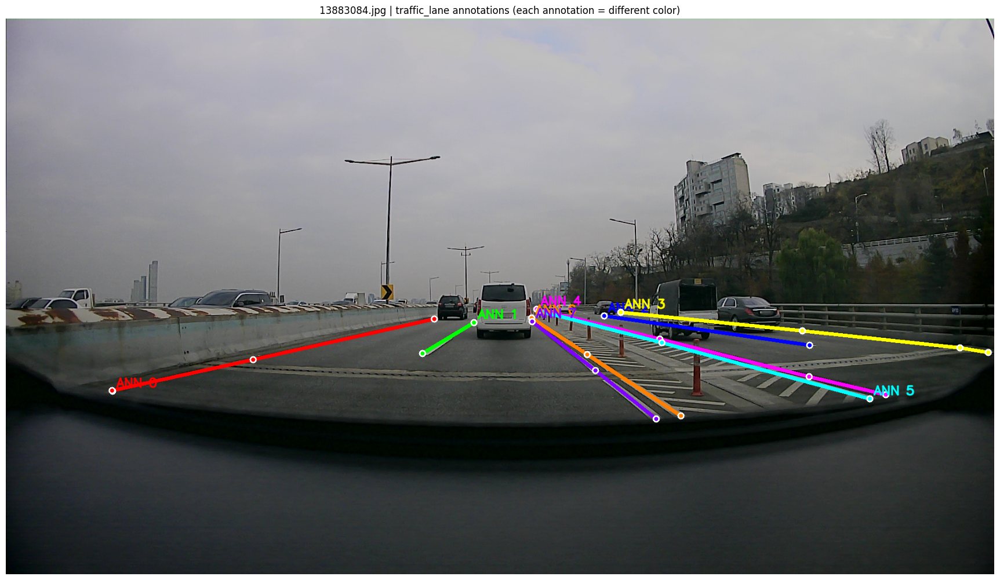


### 과거 Kaggle 조사 ② — annotation point 간 거리 확인

각 annotation의 point 수와 연속 point 사이 거리를 확인한 조사 코드다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
for idx, ann in enumerate(lane_annotations):

    points = np.array(
        [
            [point["x"], point["y"]]
            for point in ann["data"]
        ],
        dtype=np.float32
    )

    print("=" * 70)
    print(f"ANN {idx}")
    print("point 수:", len(points))
    print("좌표:")
    print(points.astype(int))

    # 연속된 point 사이 거리
    if len(points) >= 2:

        distances = np.linalg.norm(
            points[1:] - points[:-1],
            axis=1
        )

        print(
            "연속 point 사이 거리(px):",
            np.round(distances, 1)
        )

        print(
            "가장 긴 point 간 거리(px):",
            round(float(distances.max()), 1)
        )
```

**당시 출력 기록**

```text
======================================================================
ANN 0
point 수: 4
좌표:
[[207 724]
 [206 723]
 [480 663]
 [832 584]]
연속 point 사이 거리(px): [  1.4 280.5 360.8]
가장 긴 point 간 거리(px): 360.8
======================================================================
ANN 1
point 수: 2
좌표:
[[909 591]
 [809 651]]
연속 point 사이 거리(px): [116.6]
가장 긴 point 간 거리(px): 116.6
======================================================================
ANN 2
point 수: 2
좌표:
[[1162  578]
 [1561  635]]
연속 point 사이 거리(px): [403.1]
가장 긴 point 간 거리(px): 403.1
======================================================================
ANN 3
point 수: 4
좌표:
[[1194  571]
 [1547  607]
 [1853  640]
 [1908  649]]
연속 point 사이 거리(px): [354.8 307.8  55.7]
가장 긴 point 간 거리(px): 354.8
======================================================================
ANN 4
point 수: 4
좌표:
[[1031  565]
 [1270  623]
 [1560  696]
 [1709  731]]
연속 point 사이 거리(px): [245.9 299.  153.1]
가장 긴 point 간 거리(px): 299.0
======================================================================
ANN 5
point 수: 3
좌표:
[[1678  739]
 [1274  630]
 [1035  568]]
연속 point 사이 거리(px): [418.4 246.9]
가장 긴 point 간 거리(px): 418.4
======================================================================
ANN 6
point 수: 3
좌표:
[[1021  582]
 [1129  653]
 [1311  772]]
연속 point 사이 거리(px): [129.2 217.5]
가장 긴 point 간 거리(px): 217.5
======================================================================
ANN 7
point 수: 3
좌표:
[[1022  589]
 [1145  684]
 [1263  778]]
연속 point 사이 거리(px): [155.4 150.9]
가장 긴 point 간 거리(px): 155.4
```


## 조사 결과

annotation은 단순한 pixel mask가 아니라 **lane geometry를 표현하는 polyline 성격**이 강해 보였다.

하지만 당시 `segmentation_annotations_v1.jsonl`에는 결정적인 문제가 있었다.

### v1의 문제

원본 AIHub annotation에는 차선 속성이 있었지만 JSONL 생성 과정에서:

```text
solid / dotted
```

attribute가 빠져 있었다.

따라서 v1만으로는 어떤 `traffic_lane`이 solid이고 어떤 것이 dotted인지 판단할 수 없었다.

### 결정

원본 정보를 버리지 않기 위해 **v2 JSONL에서 `lane_type`을 다시 복구**한다.


# 3. Kaggle → 로컬 VS Code/Jupyter 전환 + v2 JSONL

실험/이미지 확인은 `.py`보다 Notebook이 편하므로 로컬 VS Code의 Jupyter Notebook을 사용하기로 했다.

환경:

```text
Accident_AI/
├─ .venv/
├─ data/
│  ├─ raw/images/train_09/                 # 15,000장
│  └─ annotations/
│     └─ segmentation_annotations_v2.jsonl
├─ notebooks/taegon/
│  └─ segmentation-task.ipynb
└─ src/
```

Notebook kernel도 프로젝트 `.venv`를 사용하도록 맞췄다.

v2에서는 실제로:

```json
{
  "class": "traffic_lane",
  "lane_type": "solid 또는 dotted",
  "category": "polyline"
}
```

구조를 갖는다.


In [ ]:
import sys

print(sys.executable)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

print("OpenCV :", cv2.__version__)
print("NumPy  :", np.__version__)
print("환경 확인 완료")

In [ ]:
from pathlib import Path
from collections import Counter
import json

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# 프로젝트 루트 자동 탐색
# ============================================================

CURRENT_DIR = Path.cwd().resolve()

PROJECT_ROOT = None

for candidate in [CURRENT_DIR, *CURRENT_DIR.parents]:
    if (candidate / "data").is_dir() and (candidate / "src").is_dir():
        PROJECT_ROOT = candidate
        break

assert PROJECT_ROOT is not None, "Accident_AI 프로젝트 루트를 찾지 못했습니다."


IMAGE_DIR = (
    PROJECT_ROOT
    / "data"
    / "raw"
    / "images"
    / "train_09"
)

JSONL_PATH = (
    PROJECT_ROOT
    / "data"
    / "annotations"
    / "segmentation_annotations_v2.jsonl"
)


print("PROJECT_ROOT :", PROJECT_ROOT)
print("IMAGE_DIR    :", IMAGE_DIR)
print("JSONL_PATH   :", JSONL_PATH)

print()
print("IMAGE_DIR 존재 :", IMAGE_DIR.is_dir())
print("JSONL 존재     :", JSONL_PATH.is_file())

In [ ]:
FILTERED_JSONL_PATH = (
    PROJECT_ROOT
    / "data"
    / "annotations"
    / "modelA_segmentation_annotations_v3.jsonl"
)

print("전체 v2 :", JSONL_PATH)
print("정제본   :", FILTERED_JSONL_PATH)

print()
print("전체 v2 존재 :", JSONL_PATH.is_file())
print("정제본 존재   :", FILTERED_JSONL_PATH.is_file())

In [ ]:
jpg_files = sorted(IMAGE_DIR.glob("*.jpg"))

print("JPG 개수:", len(jpg_files))
print("JPG 예시:", [p.name for p in jpg_files[:5]])


lane_type_counter = Counter()

with JSONL_PATH.open("r", encoding="utf-8") as f:
    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        if ann.get("class") == "traffic_lane":
            lane_type_counter[
                ann.get("lane_type", "missing")
            ] += 1


print("\ntraffic_lane lane_type 분포")

for lane_type, count in lane_type_counter.items():
    print(f"{lane_type:15s}: {count:,}")

In [ ]:
from collections import Counter
import json


# ============================================================
# v3 기본 Sanity Check
# ============================================================

annotation_count = 0

class_counter = Counter()
lane_type_counter = Counter()

all_images = set()

lane_images = set()
stop_images = set()
crosswalk_images = set()


with FILTERED_JSONL_PATH.open(
    "r",
    encoding="utf-8"
) as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        annotation_count += 1

        file_name = ann.get("file_name")
        cls = ann.get("class")


        # ----------------------------------------------------
        # 기본 count
        # ----------------------------------------------------

        if file_name is not None:
            all_images.add(file_name)

        if cls is not None:
            class_counter[cls] += 1


        # ----------------------------------------------------
        # class별 이미지 수
        # ----------------------------------------------------

        if cls == "traffic_lane":

            lane_images.add(file_name)

            lane_type = ann.get("lane_type")

            if lane_type is not None:
                lane_type_counter[lane_type] += 1


        elif cls == "stop_line":

            stop_images.add(file_name)


        elif cls == "crosswalk":

            crosswalk_images.add(file_name)


# ============================================================
# 실제 JPG 존재 여부
# ============================================================

missing_images = sorted([
    file_name
    for file_name in all_images
    if not (IMAGE_DIR / file_name).is_file()
])


# ============================================================
# 출력
# ============================================================

print("=" * 60)
print("modelA_segmentation_annotations_v3.jsonl")
print("=" * 60)

print()
print("[전체]")
print("annotation 수 :", annotation_count)
print("고유 이미지 수 :", len(all_images))


print()
print("[annotation class 수]")

for cls in [
    "traffic_lane",
    "stop_line",
    "crosswalk",
]:

    print(
        f"{cls:15s}:",
        class_counter.get(cls, 0)
    )


print()
print("[class가 존재하는 이미지 수]")

print(
    "traffic_lane :",
    len(lane_images)
)

print(
    "stop_line    :",
    len(stop_images)
)

print(
    "crosswalk    :",
    len(crosswalk_images)
)

print(
    "stop + cross:",
    len(
        stop_images
        & crosswalk_images
    )
)


print()
print("[traffic_lane type]")

for lane_type, count in lane_type_counter.items():

    print(
        f"{lane_type:10s}:",
        count
    )


print()
print("[JPG 매칭]")

print(
    "annotation에 있는 이미지 중 JPG 없는 수:",
    len(missing_images)
)


if missing_images:

    print("\n누락 예시:")

    for file_name in missing_images[:20]:
        print(file_name)

In [ ]:
TEST_FILE = "13883084.jpg"

IMAGE_PATH = IMAGE_DIR / TEST_FILE

assert IMAGE_PATH.is_file(), f"이미지가 없습니다: {IMAGE_PATH}"


annotations = []

with JSONL_PATH.open("r", encoding="utf-8") as f:
    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        if ann.get("file_name") == TEST_FILE:
            annotations.append(ann)


print("파일명:", TEST_FILE)
print("annotation 개수:", len(annotations))
print()


for ann in annotations:
    print(
        f'id={ann.get("annotation_id", -1):>3} | '
        f'class={ann.get("class"):<15} | '
        f'lane_type={str(ann.get("lane_type")):<8} | '
        f'category={ann.get("category"):<10} | '
        f'points={len(ann.get("data", []))}'
    )

## v2 확인 결과

- 로컬 `train_09` 이미지: **15,000장**
- `traffic_lane`에 `lane_type` 존재
- 실제 값은 `"dashed"`가 아니라 **`"dotted"`**
- solid/dotted를 Seg class 자체로 분리하지 않고 attribute로 보존할 수 있게 됨

여기서 다음 질문이 생겼다.

> `lane_type=dotted`라면 Segmentation GT도 실제 점선처럼 끊어서 만들어야 하지 않을까?


# 4. 실험 — dotted를 고정 pixel dash/gap으로 Rasterize

### 가설

```text
solid  → 연속선
dotted → 일정한 길이로 그렸다가 일정한 길이만큼 비움
```

으로 만들면 같은 `traffic_lane` 채널 안에서도 morphology 차이를 보존할 수 있을 것이라고 생각했다.

초기 임시값:

```python
dash_length = 24
gap_length  = 18
```

> 아래 코드는 **실패한 실험을 기록하기 위해 그대로 남긴다.**


### 폐기 실험 코드 ① — `draw_dotted_polyline()`

dotted를 고정 pixel dash/gap으로 만들기 위해 작성했던 함수다. 이후 실제 dash 내부를 잘못 끊는 문제가 확인되어 폐기했다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
def draw_dotted_polyline(
    mask,
    points,
    thickness=8,
    dash_length=24,
    gap_length=18,
):
    """
    polyline geometry를 따라 dotted 형태로 rasterize.

    dash_length / gap_length는 현재 검증용 임시 파라미터.
    """

    if len(points) < 2:
        return

    pattern_length = dash_length + gap_length
    accumulated_length = 0.0


    for i in range(len(points) - 1):

        p1 = points[i].astype(np.float32)
        p2 = points[i + 1].astype(np.float32)

        vector = p2 - p1
        segment_length = float(np.linalg.norm(vector))

        if segment_length <= 1e-6:
            continue

        direction = vector / segment_length
        distance = 0.0


        while distance < segment_length - 1e-6:

            global_distance = accumulated_length + distance
            phase = global_distance % pattern_length


            # dash 구간
            if phase < dash_length:

                remaining_dash = dash_length - phase

                draw_length = min(
                    remaining_dash,
                    segment_length - distance
                )

                start = p1 + direction * distance

                end = p1 + direction * (
                    distance + draw_length
                )

                cv2.line(
                    mask,
                    tuple(np.round(start).astype(int)),
                    tuple(np.round(end).astype(int)),
                    color=255,
                    thickness=thickness,
                    lineType=cv2.LINE_8
                )

                distance += draw_length


            # gap 구간
            else:

                remaining_gap = pattern_length - phase

                distance += min(
                    remaining_gap,
                    segment_length - distance
                )


        accumulated_length += segment_length
```


### 폐기 실험 코드 ② — solid/dotted 분기 Rasterization

`solid`는 연속선, `dotted`는 고정 주기 점선으로 만드는 실험 코드다. 현재 main 방식에서는 사용하지 않는다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
# ============================================================
# 이미지 읽기
# ============================================================

image = cv2.imread(str(IMAGE_PATH))

assert image is not None, "이미지를 읽지 못했습니다."

H, W = image.shape[:2]

print("이미지 크기:", H, W)


# ============================================================
# 3-channel target용 binary mask
# ============================================================

lane_mask = np.zeros((H, W), dtype=np.uint8)
stop_mask = np.zeros((H, W), dtype=np.uint8)
crosswalk_mask = np.zeros((H, W), dtype=np.uint8)


# ============================================================
# 테스트용 설정
# ============================================================

LANE_THICKNESS = 8
STOP_THICKNESS = 12

DOTTED_DASH_LENGTH = 24
DOTTED_GAP_LENGTH = 18


# ============================================================
# Rasterization
# ============================================================

for ann in annotations:

    cls = ann.get("class")
    category = ann.get("category")

    data = ann.get("data", [])

    if not data:
        continue


    points = np.array(
        [
            [p["x"], p["y"]]
            for p in data
        ],
        dtype=np.int32
    )


    # 이미지 영역 밖 좌표 방지
    points[:, 0] = np.clip(points[:, 0], 0, W - 1)
    points[:, 1] = np.clip(points[:, 1], 0, H - 1)

    points_cv = points.reshape(-1, 1, 2)


    # ========================================================
    # traffic_lane
    # ========================================================

    if cls == "traffic_lane" and category == "polyline":

        if len(points) < 2:
            continue

        lane_type = ann.get("lane_type", "unknown")


        # solid → 연속선
        if lane_type == "solid":

            cv2.polylines(
                lane_mask,
                [points_cv],
                isClosed=False,
                color=255,
                thickness=LANE_THICKNESS,
                lineType=cv2.LINE_8
            )


        # dotted → 끊어진 선
        elif lane_type == "dotted":

            draw_dotted_polyline(
                lane_mask,
                points,
                thickness=LANE_THICKNESS,
                dash_length=DOTTED_DASH_LENGTH,
                gap_length=DOTTED_GAP_LENGTH
            )


        # 예상치 못한 타입 → geometry 보존
        else:

            print(
                "[WARNING]",
                ann.get("annotation_id"),
                lane_type
            )

            cv2.polylines(
                lane_mask,
                [points_cv],
                isClosed=False,
                color=255,
                thickness=LANE_THICKNESS,
                lineType=cv2.LINE_8
            )


    # ========================================================
    # stop_line
    # ========================================================

    elif cls == "stop_line" and category == "polyline":

        if len(points) < 2:
            continue

        cv2.polylines(
            stop_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=STOP_THICKNESS,
            lineType=cv2.LINE_8
        )


    # ========================================================
    # crosswalk
    # ========================================================

    elif cls == "crosswalk" and category == "polygon":

        if len(points) < 3:
            continue

        cv2.fillPoly(
            crosswalk_mask,
            [points_cv],
            color=255
        )


print("lane pixels      :", np.count_nonzero(lane_mask))
print("stop pixels      :", np.count_nonzero(stop_mask))
print("crosswalk pixels :", np.count_nonzero(crosswalk_mask))
```

**당시 출력 기록**

```text
이미지 크기: 1080 1920
lane pixels      : 32078
stop pixels      : 0
crosswalk pixels : 0
```


### 폐기 실험 코드 ③ — dotted 실험 Overlay

고정 dash/gap 실험의 시각화 코드와 당시 결과다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
image_rgb = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)


seg_color = np.zeros(
    (H, W, 3),
    dtype=np.uint8
)


# lane = 빨강
seg_color[lane_mask > 0] = [255, 0, 0]

# stop_line = 초록
seg_color[stop_mask > 0] = [0, 255, 0]

# crosswalk = 파랑
seg_color[crosswalk_mask > 0] = [0, 0, 255]


overlay = cv2.addWeighted(
    image_rgb,
    0.7,
    seg_color,
    0.6,
    0
)


plt.figure(figsize=(18, 10))

plt.imshow(overlay)

plt.title(
    "Red = traffic_lane | "
    "Green = stop_line | "
    "Blue = crosswalk"
)

plt.axis("off")
plt.show()
```

**당시 시각화 결과 1**

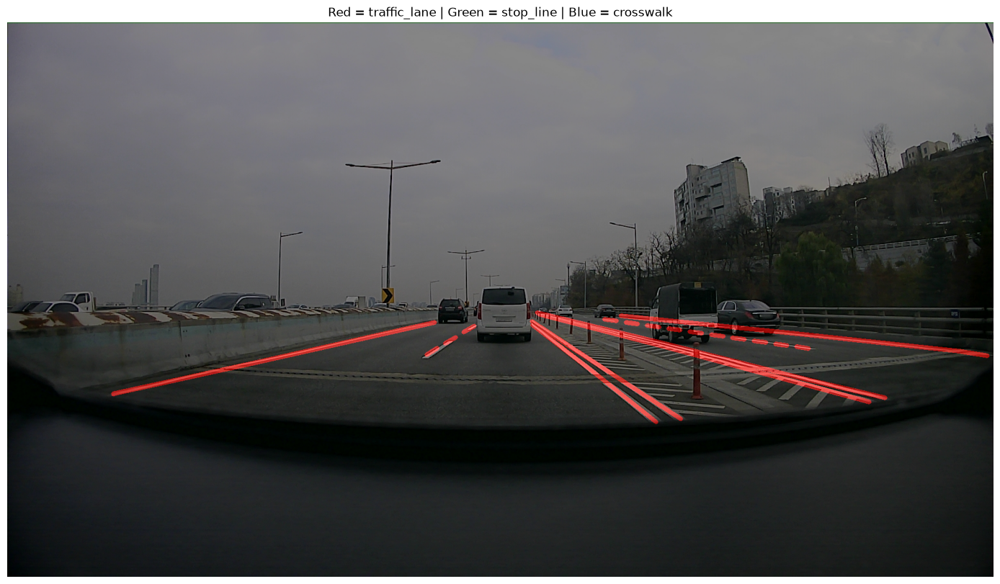


## ❌ 실험 결과 — 고정 dash/gap 방식 폐기

원본 overlay를 확인하자 치명적인 문제가 보였다.

실제 이미지에서 하나로 붙어 있는 점선 도색 한 조각이:

```text
실제
━━━━━━━━━━━━━━
```

인데 rasterizer가 고정 주기를 강제로 적용하면서:

```text
잘못된 GT
━━━━   ━━━━━
```

처럼 **실제 foreground 중간을 background로 잘라버렸다.**

### 왜 실패했는가?

1. JSONL의 `lane_type=dotted`는 알려주지만 실제 dash의 시작점/끝점 pixel 좌표를 알려주지는 않는다.
2. 이미지 perspective 때문에 가까운 dash와 먼 dash의 pixel 길이가 다르다.
3. 모든 위치에 같은 `24/18` 규칙을 적용하면 실제 paint와 어긋난다.
4. 단순히 `24/18 → 12/6`처럼 더 짧게 만든다고 근본 문제가 해결되지 않는다.

### 결정

```text
고정 pixel 주기 dotted GT 생성
```

은 **현재 최종 방식에서 사용하지 않는다.**


# 5. dotted annotation의 point가 실제로 무엇을 의미하는지 확대 조사

고정 주기를 버린 뒤, 먼저 데이터 자체를 더 정확하게 보기로 했다.

질문:

> `dotted` annotation의 point 하나가 실제 dash 하나를 의미하는가?

dotted annotation만 모아서 여러 이미지에 표시하고, `13883084.jpg`를 annotation별로 crop하여 원본과 비교했다.


### 과거 EDA ① — dotted annotation 이미지별 수집

`lane_type=dotted` annotation의 분포와 샘플을 조사했던 코드다. 결론 도출 후에는 매번 실행할 필요가 없어 기록으로 동결한다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
from collections import defaultdict
import json

dotted_by_image = defaultdict(list)

with JSONL_PATH.open("r", encoding="utf-8") as f:
    for line in f:
        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        if (
            ann.get("class") == "traffic_lane"
            and ann.get("lane_type") == "dotted"
            and ann.get("category") == "polyline"
        ):
            dotted_by_image[ann["file_name"]].append(ann)


print("dotted가 존재하는 이미지 수:", len(dotted_by_image))

print("\n예시:")
for file_name, anns in list(dotted_by_image.items())[:10]:
    print(
        file_name,
        "| dotted annotation 수:",
        len(anns)
    )
```

**당시 출력 기록**

```text
dotted가 존재하는 이미지 수: 12274

예시:
13883084.jpg | dotted annotation 수: 2
13883085.jpg | dotted annotation 수: 2
13883471.jpg | dotted annotation 수: 2
13883472.jpg | dotted annotation 수: 2
13883473.jpg | dotted annotation 수: 2
13883474.jpg | dotted annotation 수: 2
13883475.jpg | dotted annotation 수: 2
13883476.jpg | dotted annotation 수: 2
13883477.jpg | dotted annotation 수: 2
13883478.jpg | dotted annotation 수: 2
```


### 과거 EDA ② — dotted annotation 원본 위 시각화

dotted annotation geometry와 실제 point를 여러 이미지에서 확인했던 코드와 당시 시각화 결과다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
import cv2
import numpy as np
import matplotlib.pyplot as plt


# 확인할 이미지 수
NUM_IMAGES = 6

sample_files = list(dotted_by_image.keys())[:NUM_IMAGES]


for file_name in sample_files:

    image_path = IMAGE_DIR / file_name

    image = cv2.imread(str(image_path))

    if image is None:
        print("읽기 실패:", file_name)
        continue

    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    vis = image_rgb.copy()

    anns = dotted_by_image[file_name]


    for idx, ann in enumerate(anns):

        points = np.array(
            [
                [p["x"], p["y"]]
                for p in ann["data"]
            ],
            dtype=np.int32
        )

        if len(points) < 2:
            continue


        # annotation geometry 그대로 표시
        cv2.polylines(
            vis,
            [points.reshape(-1, 1, 2)],
            isClosed=False,
            color=(255, 0, 0),
            thickness=5,
            lineType=cv2.LINE_8
        )


        # 실제 annotation point
        for x, y in points:

            cv2.circle(
                vis,
                (int(x), int(y)),
                6,
                (255, 255, 0),
                -1
            )


        # annotation id 표시
        x0, y0 = points[0]

        cv2.putText(
            vis,
            f'ID {ann["annotation_id"]}',
            (int(x0) + 5, int(y0) - 8),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (0, 255, 0),
            2,
            cv2.LINE_AA
        )


    plt.figure(figsize=(18, 10))

    plt.imshow(vis)

    plt.title(
        f"{file_name} | "
        f"dotted annotations = {len(anns)}"
    )

    plt.axis("off")
    plt.show()
```

**당시 시각화 결과 1**

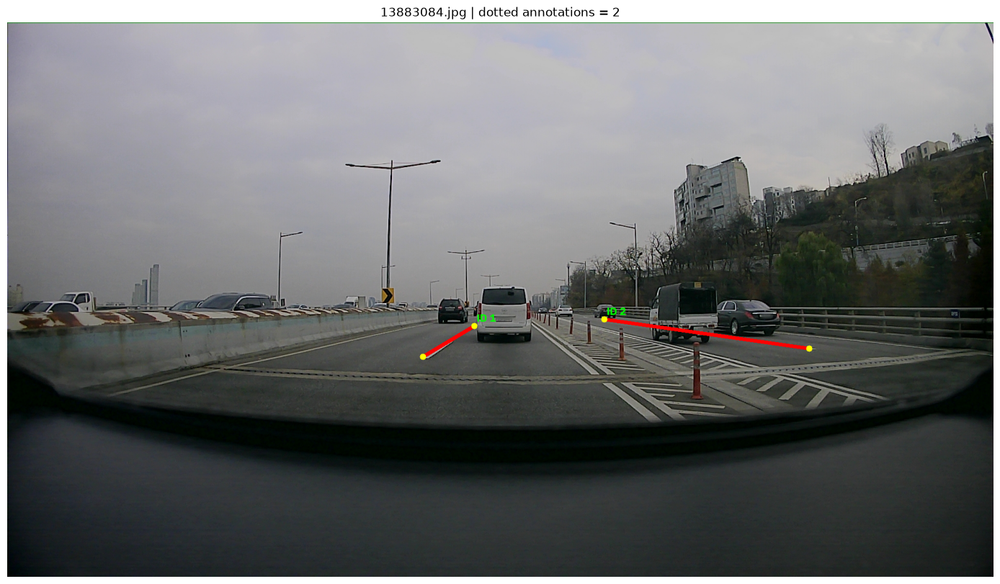

**당시 시각화 결과 2**

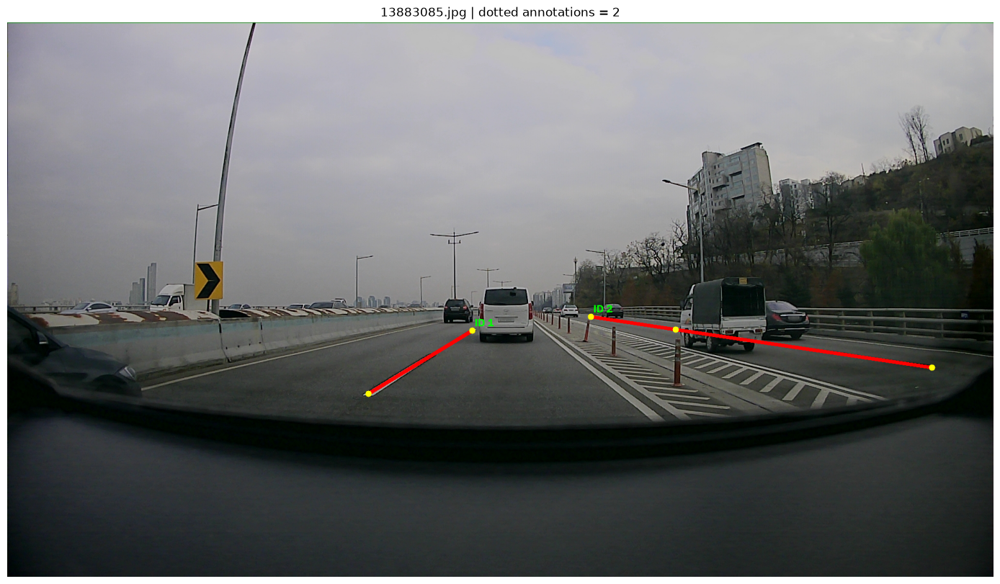

**당시 시각화 결과 3**

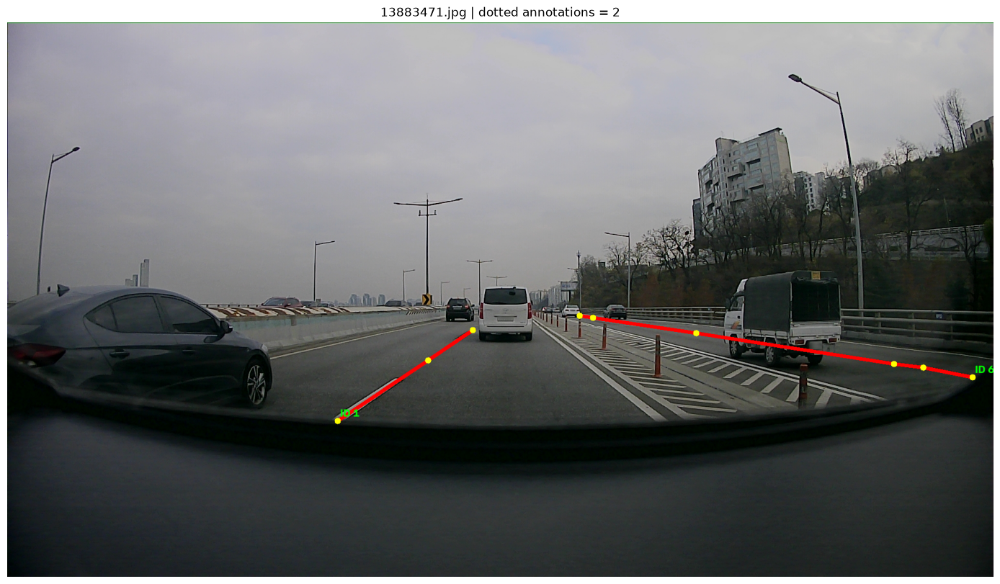

**당시 시각화 결과 4**

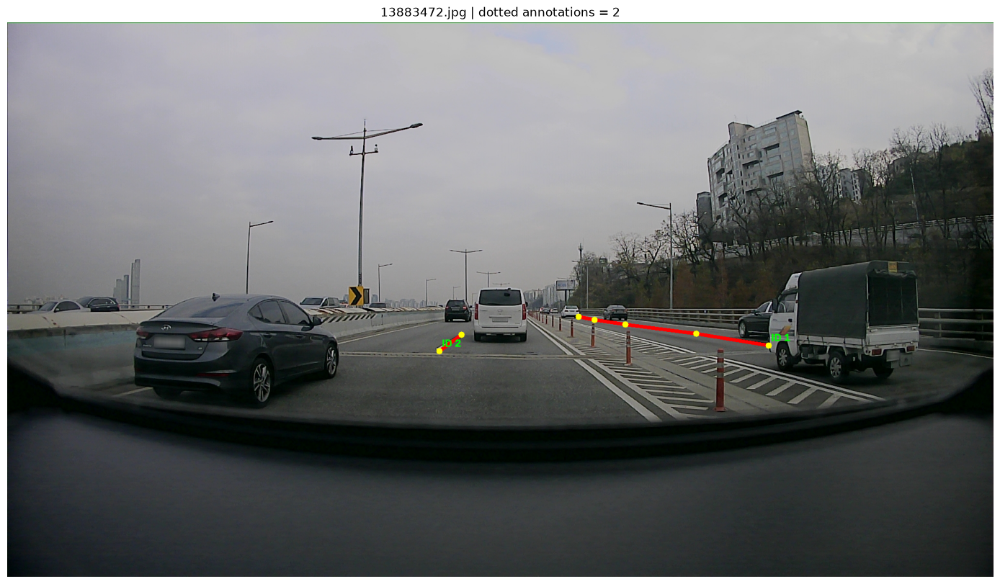

**당시 시각화 결과 5**

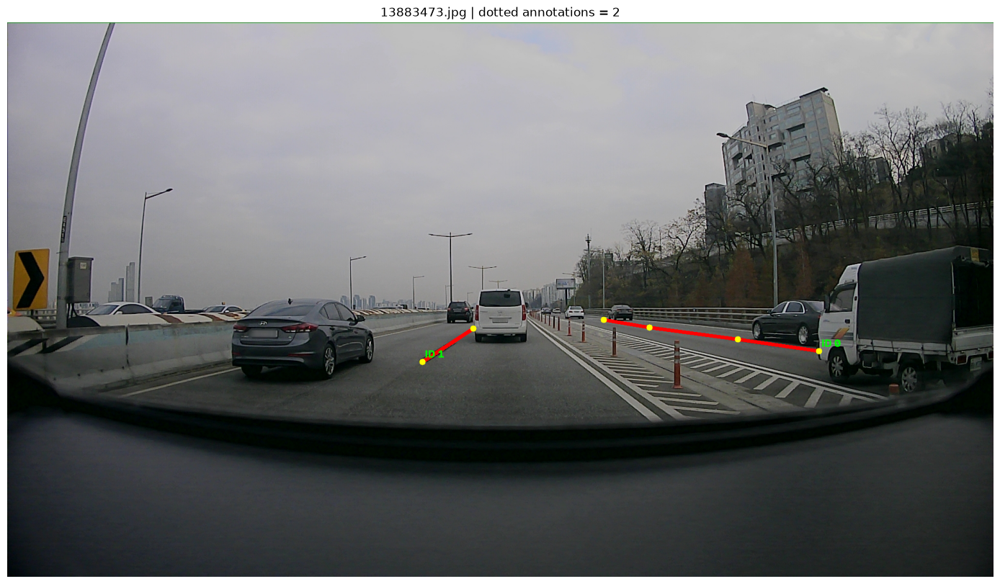

**당시 시각화 결과 6**

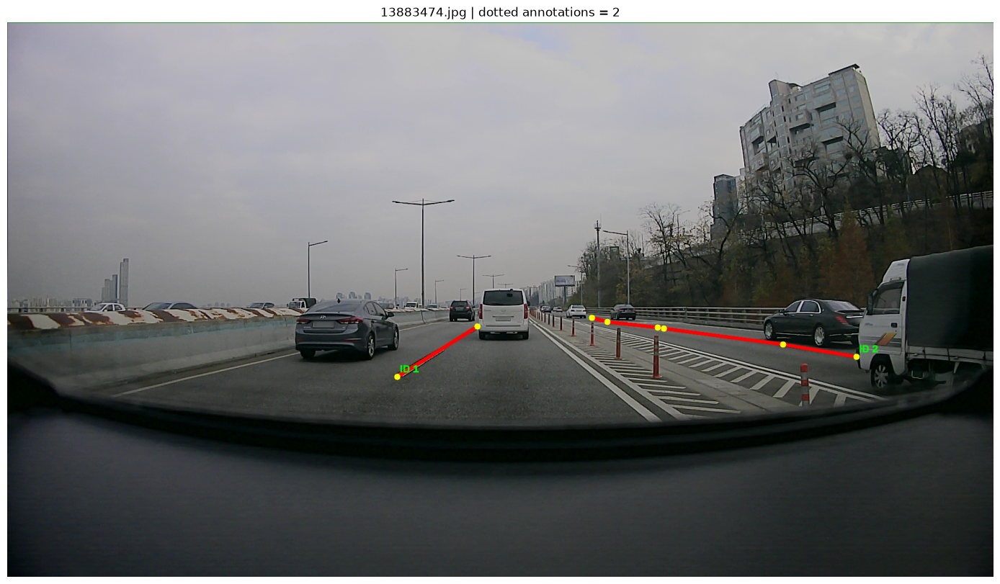


### 과거 EDA ③ — 13883084 dotted annotation 확대

`ann_id=1`, `ann_id=2`를 확대하여 point 의미가 일관된 dash 경계가 아님을 확인했던 코드와 당시 결과다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
TEST_FILE = "13883084.jpg"

anns = dotted_by_image[TEST_FILE]

image_path = IMAGE_DIR / TEST_FILE

image = cv2.imread(str(image_path))

assert image is not None

image_rgb = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)

H, W = image_rgb.shape[:2]


for ann in anns:

    points = np.array(
        [
            [p["x"], p["y"]]
            for p in ann["data"]
        ],
        dtype=np.int32
    )

    if len(points) < 2:
        continue


    # ----------------------------------------
    # annotation 주변 crop 범위
    # ----------------------------------------

    margin = 70

    x_min = max(
        int(points[:, 0].min()) - margin,
        0
    )

    x_max = min(
        int(points[:, 0].max()) + margin,
        W
    )

    y_min = max(
        int(points[:, 1].min()) - margin,
        0
    )

    y_max = min(
        int(points[:, 1].max()) + margin,
        H
    )


    # ----------------------------------------
    # annotation 표시
    # ----------------------------------------

    vis = image_rgb.copy()

    cv2.polylines(
        vis,
        [points.reshape(-1, 1, 2)],
        isClosed=False,
        color=(255, 0, 0),
        thickness=5,
        lineType=cv2.LINE_8
    )


    for x, y in points:

        cv2.circle(
            vis,
            (int(x), int(y)),
            6,
            (255, 255, 0),
            -1
        )


    crop = vis[
        y_min:y_max,
        x_min:x_max
    ]


    print(
        "annotation_id:",
        ann["annotation_id"]
    )

    print(
        "points:",
        ann["data"]
    )


    plt.figure(figsize=(12, 5))

    plt.imshow(crop)

    plt.title(
        f'{TEST_FILE} | '
        f'dotted | '
        f'annotation_id={ann["annotation_id"]}'
    )

    plt.axis("off")

    plt.show()
```

**당시 출력 기록**

```text
annotation_id: 1
points: [{'x': 909, 'y': 591}, {'x': 809, 'y': 651}]
```

**당시 시각화 결과 1**

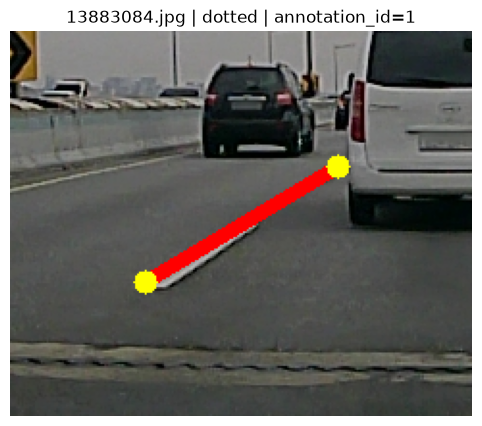

**당시 출력 기록**

```text
annotation_id: 2
points: [{'x': 1162, 'y': 578}, {'x': 1561, 'y': 635}]
```

**당시 시각화 결과 2**

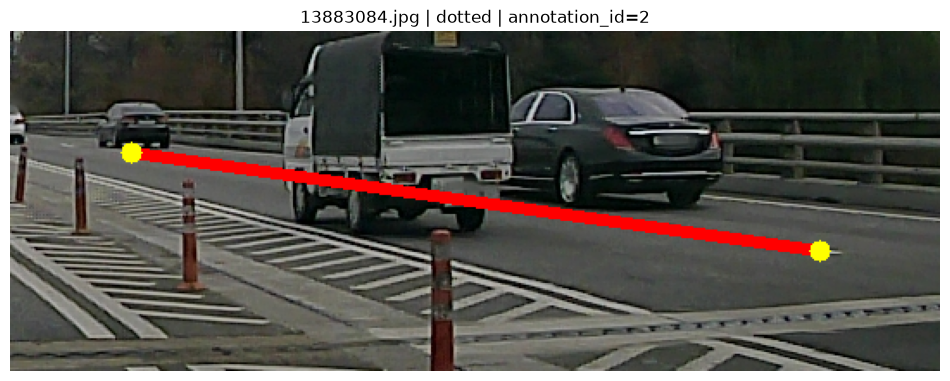


## dotted 확대 조사 결과

대표 예:

```text
ann_id=1
points = [(909, 591), (809, 651)]

ann_id=2
points = [(1162, 578), (1561, 635)]
```

원본과 비교했을 때:

- 어떤 annotation은 비교적 짧은 실제 marking 구간을 나타내는 것처럼 보임
- 어떤 annotation은 매우 넓은 영역을 point 2개로 요약하고 있음
- 따라서 `point 1개 = dash 1개`라고 확정할 수 없음
- `point 사이 전체 = 실제 paint`라고 볼 수도 없음

### 현재 가장 안전한 데이터 해석

`traffic_lane`의 annotation은:

> **pixel-perfect한 차선 페인트 segmentation GT라기보다, 차선의 위치/방향/흐름을 표현하는 sparse geometry annotation**

에 가깝다.

따라서 JSONL만 이용해서 실제 dotted paint의 끊긴 위치를 기가 막히게 복원하려는 시도 자체가 데이터 목적과 맞지 않을 수 있다.


# 6. 설계 재검토 — Raster GT / Encoder / Seg / Vector 관계

이 과정에서 가장 크게 헷갈린 부분:

> “Segmentation을 학습할 때 rasterized 이미지를 Encoder 입력으로 넣는가?”

### ❌ 잘못 이해하면 이런 구조

```text
Rasterized Mask
      ↓
Encoder
      ↓
Vector
```

### ✅ 실제 의도한 Multi-task 구조

```text
                         원본 RGB 이미지
                              │
                              ▼
                        Shared Encoder
                              │
                ┌─────────────┴─────────────┐
                │                           │
                ▼                           ▼
        Segmentation Head               Vector Head
                │                           │
                ▼                           ▼
         Seg Prediction              Vector Prediction
                │                           │
                ▼                           ▼
        Rasterized GT와 Loss          Vector GT와 Loss
```

**Rasterized mask는 Encoder 입력이 아니라 Segmentation 정답지(GT)** 다.

따라서 Vector Head는 Seg mask만 보는 것이 아니다.

Vector가 사용할 수 있는 정보:

```text
1. Shared Encoder가 원본 RGB에서 뽑은 feature
2. Seg Head가 예측한 lane 위치/flow 정보 (optional spatial hint)
```

즉:

```text
Vector input
=
RGB Encoder Feature
+
Seg Lane-flow Hint
```

이고,

```text
Vector input = Seg mask only
```

가 아니다.

이 구분 덕분에 Seg lane GT가 solid/dotted를 분리하지 않더라도,  
Vector는 **원본 RGB의 실제 dotted/solid 패턴**을 보고 `lane_type`을 학습할 수 있다.


# 7. 현재 잠정 설계 — 세 target의 목적을 분리

세 Segmentation target의 역할은 동일하지 않다고 정리했다.

## `stop_line`

- 위치 자체가 중요
- 이후 position 정보로 직접 가져올 수 있음
- **비교적 정밀한 rasterization 필요**

## `crosswalk`

- 존재 + 영역/위치가 중요
- **비교적 정밀한 polygon rasterization 필요**

## `traffic_lane`

- 실제 페인트 pixel을 완벽히 복원하는 것이 최종 목적이 아님
- Vector의 point/geometry 추정을 돕는 **lane flow / spatial prior**
- solid/dotted를 Seg 단계에서 pixel-perfect하게 복원할 필요는 없음
- JSONL polyline을 이용해 대략적인 위치/방향/흐름을 안정적으로 제공하는 것이 더 중요

따라서 `traffic_lane mask`라는 이름보다 의미상:

```text
lane_flow_mask
lane_geometry_raster
```

에 가깝다고 보는 것이 현재 판단이다.


# 8. 현재 Model A 역할 분담

```text
                           RGB IMAGE
                               │
                               ▼
                         Shared Encoder
                               │
              ┌────────────────┴────────────────┐
              │                                 │
              ▼                                 ▼
        Segmentation Head                   Vector Head
              │                                 │
      ┌───────┼────────┐                ┌───────┴────────┐
      │       │        │                │                │
 lane flow  stop    crosswalk         points          lane_type
      │      line       │             geometry       solid/dotted
      │       │         │                │                │
      └───────┴─────────┘                │                │
              │                          │                │
              └────── spatial hint ──────┤                │
                                         └────────┬───────┘
                                                  ▼
                                           Geometry Builder
                                                  │
                                        near / mid / far
                                           association
                                                  │
                                                  ▼
                                             Lane Track
                                                  │
                                       geometry + lane_type
                                                  │
                                                  ▼
                                                 BEV
```

## solid / dotted는 어디서 학습하는가?

Vector Head는 원본 RGB의 Encoder feature를 보기 때문에 실제 영상의:

```text
solid  → ━━━━━━━━━━━━━━━
dotted → ━━━   ━━━   ━━━
```

차이를 학습할 수 있다.

학습 시:

```text
GT lane_type = solid / dotted
```

로 supervision한다.

추론 시에는 GT가 없고 모델이 `predicted lane_type`을 만든다.

## BEV 표현

Geometry Builder가 얻은:

```text
geometry + predicted lane_type
```

을 사용해서:

```text
solid
━━━━━━━━━━━━━━━━━━

dotted
━━━━    ━━━━    ━━━━
```

로 표현한다.

Image space보다 BEV에서 일정 dash/gap을 정의하는 편이 perspective 문제도 적고 더 자연스럽다.


# 9. near / mid / far와 lane_id 문제

Vector 쪽에서는 한 실제 physical lane이 depth에 따라 서로 다른 `lane_id`처럼 나타날 수 있는 문제가 있다.

따라서 기존 `lane_id`를 최종 lane identity로 그대로 쓰지 않고, **lane observation**으로 취급한 뒤 Geometry Builder에서 다시 association한다.

```text
near observation #0 ─┐
mid  observation #3 ─┼──> canonical Lane Track #0
far  observation #7 ─┘
```

### 역할

```text
NEAR
→ ego vehicle에 가깝고 정보가 많음
→ lane identity/order를 잡는 강한 anchor

MID
→ geometry continuation

FAR
→ heading / curvature continuation
```

중요:

> **near만 가지고 BEV를 만드는 것이 아니다.**

near를 anchor로 두고 mid/far를 같은 lane으로 association한 뒤 **전체 geometry**로 BEV를 만든다.

association 후보 기준:

- 위치 연속성
- endpoint ↔ startpoint 거리
- 진행 방향
- 기울기
- 곡률
- lane-flow Segmentation이 중간 영역을 지지하는지
- Vector confidence
- 좌/우 lane ordering


# 10. 현재 기준 Rasterization 코드 — 다음 실험 출발점

아래는 **현재 잠정 설계 기준으로 다시 시작할 코드**다.

핵심:

```text
traffic_lane
→ solid/dotted 모두 polyline geometry를 연속 rasterize
→ 목적: 실제 paint mask가 아니라 lane flow / spatial hint

stop_line
→ polyline

crosswalk
→ polygon fill
```

`lane_type`은 JSONL에서 **절대 삭제하지 않는다.**  
다만 이 Seg GT 생성에서는 사용하지 않고 Vector supervision에 보존한다.

> 이 코드는 현재 방향의 출발점이며, thickness와 여러 장 검증 후 다시 수정될 수 있다.


In [ ]:
# ============================================================
# 현재 기준: 1장 lane-flow / stop_line / crosswalk Rasterize
# ============================================================

TEST_FILE = "13883084.jpg"
IMAGE_PATH = IMAGE_DIR / TEST_FILE

assert IMAGE_PATH.is_file(), f"이미지가 없습니다: {IMAGE_PATH}"

annotations = []

with JSONL_PATH.open("r", encoding="utf-8") as f:
    for line in f:
        line = line.strip()
        if not line:
            continue

        ann = json.loads(line)

        if ann.get("file_name") == TEST_FILE:
            annotations.append(ann)


image = cv2.imread(str(IMAGE_PATH))
assert image is not None, "이미지를 읽지 못했습니다."

H, W = image.shape[:2]

lane_flow_mask = np.zeros((H, W), dtype=np.uint8)
stop_mask = np.zeros((H, W), dtype=np.uint8)
crosswalk_mask = np.zeros((H, W), dtype=np.uint8)

# 아직 임시값 — 여러 장 검증 후 확정
LANE_THICKNESS = 8
STOP_THICKNESS = 12


for ann in annotations:
    cls = ann.get("class")
    category = ann.get("category")
    data = ann.get("data", [])

    if not data:
        continue

    points = np.array(
        [[p["x"], p["y"]] for p in data],
        dtype=np.int32
    )

    # image boundary 보호
    points[:, 0] = np.clip(points[:, 0], 0, W - 1)
    points[:, 1] = np.clip(points[:, 1], 0, H - 1)

    points_cv = points.reshape(-1, 1, 2)


    # --------------------------------------------------------
    # traffic_lane
    # solid / dotted를 구분해 paint를 재현하는 것이 아니라
    # Vector에 줄 lane-flow spatial prior를 생성한다.
    # lane_type 정보 자체는 JSONL에 그대로 보존한다.
    # --------------------------------------------------------
    if cls == "traffic_lane" and category == "polyline":

        if len(points) < 2:
            continue

        cv2.polylines(
            lane_flow_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=LANE_THICKNESS,
            lineType=cv2.LINE_8
        )


    # --------------------------------------------------------
    # stop_line
    # --------------------------------------------------------
    elif cls == "stop_line" and category == "polyline":

        if len(points) < 2:
            continue

        cv2.polylines(
            stop_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=STOP_THICKNESS,
            lineType=cv2.LINE_8
        )


    # --------------------------------------------------------
    # crosswalk
    # --------------------------------------------------------
    elif cls == "crosswalk" and category == "polygon":

        if len(points) < 3:
            continue

        cv2.fillPoly(
            crosswalk_mask,
            [points_cv],
            color=255
        )


print("lane-flow pixels :", np.count_nonzero(lane_flow_mask))
print("stop-line pixels :", np.count_nonzero(stop_mask))
print("crosswalk pixels :", np.count_nonzero(crosswalk_mask))


# ============================================================
# Overlay
# ============================================================

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

seg_color = np.zeros((H, W, 3), dtype=np.uint8)

seg_color[lane_flow_mask > 0] = [255, 0, 0]   # red
seg_color[stop_mask > 0] = [0, 255, 0]        # green
seg_color[crosswalk_mask > 0] = [0, 0, 255]   # blue

overlay = cv2.addWeighted(
    image_rgb,
    0.7,
    seg_color,
    0.6,
    0
)

plt.figure(figsize=(18, 10))
plt.imshow(overlay)
plt.title(
    "Current target | "
    "Red = lane flow | Green = stop_line | Blue = crosswalk"
)
plt.axis("off")
plt.show()


## 13883084.jpg 1차 검증 결과

### 결과
현재 방식의 rasterization이 의도대로 동작함.

- traffic_lane:
  - solid / dotted 구분 없이 연속 polyline으로 rasterize
  - 실제 차선의 대략적인 위치와 flow를 잘 유지함
  - dotted가 연속선으로 표현되는 것은 현재 lane-flow target 정의상 의도된 결과

- stop_line:
  - 해당 이미지 annotation 없음 → mask pixel 0

- crosswalk:
  - 해당 이미지 annotation 없음 → mask pixel 0

### 판단
현재 traffic_lane rasterization 규칙은 우선 유지.

단,
`LANE_THICKNESS = 8`, `STOP_THICKNESS = 12`는 아직 임시값이며
여러 이미지에서 추가 검증 후 확정한다.

### 다음 단계
여러 종류의 이미지에서 같은 규칙이 유지되는지 샘플 검증.
특히 stop_line / crosswalk가 존재하는 이미지도 반드시 포함하여 확인한다.

# 11. 현재 복귀 지점 / 다음 TODO

## 현재까지 결정된 것

- [x] Seg 입력은 원본 RGB
- [x] Rasterized mask는 Seg GT
- [x] Seg target은 `traffic_lane / stop_line / crosswalk`
- [x] background 별도 채널 없음
- [x] v2 JSONL에서 `lane_type=solid/dotted` 보존
- [x] 고정 pixel dash/gap dotted rasterization은 폐기
- [x] `traffic_lane`은 lane-flow / geometry spatial hint로 보는 방향
- [x] `stop_line`, `crosswalk`은 상대적으로 더 정밀하게
- [x] Vector는 Encoder RGB feature를 직접 사용
- [x] Seg lane-flow는 Vector의 추가 spatial hint  
- [x] Vector에서 geometry + lane_type 예측  
- [x] BEV에서 geometry와 lane_type을 결합해 solid/dotted 렌더링
- [x] near는 anchor이지만 mid/far까지 association하여 하나의 lane track 구성

## 다음 작업

- [ ] 현재 lane-flow 방식으로 여러 샘플 시각화
- [ ] random 10~20장 우선 확인
- [ ] 문제가 없으면 40~50장까지 확대
- [ ] `LANE_THICKNESS` 검토
- [ ] `STOP_THICKNESS` 검토
- [ ] crosswalk polygon 품질 확인
- [ ] stop_line 위치 품질 확인
- [ ] lane-flow가 Vector hint로 사용하기 충분한지 확인
- [ ] 전체 15,000장 rasterize 규칙 확정
- [ ] 확정된 rasterizer를 `.py`로 분리
- [ ] PyTorch Dataset / DataLoader 구성
- [ ] Seg loss 및 class imbalance 설계
- [ ] Vector Head와 Seg lane hint 결합 방식 설계
- [ ] near/mid/far association 규칙 구체화

---

## 리뷰 시 기억할 한 문장

> **Seg는 lane의 정밀 paint 복원보다 flow/위치 힌트를 주고, Vector는 RGB feature와 그 hint를 결합해 실제 lane geometry와 solid/dotted 속성을 예측하며, Builder가 이를 lane track과 BEV 표현으로 완성한다.**


# 12. stop_line / crosswalk 대표 샘플 찾기

## 목적

13883084.jpg에서 traffic_lane의 lane-flow rasterization은 1차 확인했다.

다음으로 실제 `stop_line`, `crosswalk` annotation이 존재하는 이미지를 찾아
각각 한 장씩 원본 annotation과 rasterization 품질을 확인한다.

아직 여러 장 랜덤 검증으로 넘어가지 않는다.

확인 순서:

1. stop_line이 있는 이미지 찾기
2. crosswalk가 있는 이미지 찾기
3. 각각 한 장씩 rasterize
4. 실제 위치/영역과 비교
5. 이상 없으면 여러 장 검증으로 확대

In [ ]:
from collections import defaultdict
import json


# ============================================================
# 이미지별 annotation class 정리
# ============================================================

classes_by_image = defaultdict(set)
counts_by_image = defaultdict(lambda: defaultdict(int))


with JSONL_PATH.open("r", encoding="utf-8") as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        file_name = ann.get("file_name")
        cls = ann.get("class")

        if file_name is None or cls is None:
            continue

        classes_by_image[file_name].add(cls)
        counts_by_image[file_name][cls] += 1


# ============================================================
# class별 이미지 찾기
# ============================================================

stop_files = [
    file_name
    for file_name, classes in classes_by_image.items()
    if "stop_line" in classes
]

crosswalk_files = [
    file_name
    for file_name, classes in classes_by_image.items()
    if "crosswalk" in classes
]

both_files = [
    file_name
    for file_name, classes in classes_by_image.items()
    if (
        "stop_line" in classes
        and "crosswalk" in classes
    )
]


print("stop_line이 있는 이미지 수 :", len(stop_files))
print("crosswalk이 있는 이미지 수 :", len(crosswalk_files))
print("둘 다 있는 이미지 수       :", len(both_files))


print("\n[stop_line 예시]")
for file_name in stop_files[:10]:

    print(
        file_name,
        "| lane:",
        counts_by_image[file_name].get("traffic_lane", 0),
        "| stop:",
        counts_by_image[file_name].get("stop_line", 0),
        "| crosswalk:",
        counts_by_image[file_name].get("crosswalk", 0),
    )


print("\n[crosswalk 예시]")
for file_name in crosswalk_files[:10]:

    print(
        file_name,
        "| lane:",
        counts_by_image[file_name].get("traffic_lane", 0),
        "| stop:",
        counts_by_image[file_name].get("stop_line", 0),
        "| crosswalk:",
        counts_by_image[file_name].get("crosswalk", 0),
    )


print("\n[stop_line + crosswalk 둘 다 있는 예시]")
for file_name in both_files[:10]:

    print(
        file_name,
        "| lane:",
        counts_by_image[file_name].get("traffic_lane", 0),
        "| stop:",
        counts_by_image[file_name].get("stop_line", 0),
        "| crosswalk:",
        counts_by_image[file_name].get("crosswalk", 0),
    )

# 13. stop_line / crosswalk 1장 정밀 검증 — 13886849.jpg

## 목적

traffic_lane은 13883084.jpg에서 lane-flow 방식으로 1차 검증했다.

이번에는 stop_line과 crosswalk가 각각 1개씩 존재하는
`13886849.jpg`를 이용하여 실제 annotation 위치와 rasterized GT가
원본 구조와 얼마나 잘 맞는지 확인한다.

### 확인 항목

- traffic_lane: 대략적인 lane flow가 자연스러운가?
- stop_line: 실제 정지선 위치와 잘 맞는가?
- crosswalk: 실제 횡단보도 영역과 polygon이 잘 맞는가?
- 현재 임시 thickness가 지나치게 두껍거나 얇지는 않은가?

※ 아직 thickness 값은 확정하지 않는다.

In [ ]:
# ============================================================
# stop_line / crosswalk 대표 1장 검증
# ============================================================

TEST_FILE = "13886849.jpg"
IMAGE_PATH = IMAGE_DIR / TEST_FILE

assert IMAGE_PATH.is_file(), f"이미지가 없습니다: {IMAGE_PATH}"


# ============================================================
# 1. 해당 이미지 annotation 가져오기
# ============================================================

annotations = []

with JSONL_PATH.open("r", encoding="utf-8") as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        if ann.get("file_name") == TEST_FILE:
            annotations.append(ann)


print("파일:", TEST_FILE)
print("전체 annotation 수:", len(annotations))


for ann in annotations:

    print(
        "id:",
        ann.get("annotation_id"),
        "| class:",
        ann.get("class"),
        "| category:",
        ann.get("category"),
        "| lane_type:",
        ann.get("lane_type"),
        "| points:",
        len(ann.get("data", []))
    )


# ============================================================
# 2. 원본 이미지
# ============================================================

image = cv2.imread(str(IMAGE_PATH))
assert image is not None, "이미지를 읽지 못했습니다."

image_rgb = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)

H, W = image.shape[:2]


plt.figure(figsize=(18, 10))
plt.imshow(image_rgb)
plt.title(f"{TEST_FILE} | Original")
plt.axis("off")
plt.show()


# ============================================================
# 3. 현재 기준 Rasterization
# ============================================================

lane_flow_mask = np.zeros(
    (H, W),
    dtype=np.uint8
)

stop_mask = np.zeros(
    (H, W),
    dtype=np.uint8
)

crosswalk_mask = np.zeros(
    (H, W),
    dtype=np.uint8
)


# 아직 임시값
LANE_THICKNESS = 8
STOP_THICKNESS = 12


for ann in annotations:

    cls = ann.get("class")
    category = ann.get("category")
    data = ann.get("data", [])

    if not data:
        continue


    points = np.array(
        [
            [p["x"], p["y"]]
            for p in data
        ],
        dtype=np.int32
    )


    # 좌표 image boundary 안으로 제한
    points[:, 0] = np.clip(
        points[:, 0],
        0,
        W - 1
    )

    points[:, 1] = np.clip(
        points[:, 1],
        0,
        H - 1
    )


    points_cv = points.reshape(
        -1,
        1,
        2
    )


    # --------------------------------------------------------
    # traffic_lane
    # lane flow / spatial hint
    # --------------------------------------------------------

    if (
        cls == "traffic_lane"
        and category == "polyline"
    ):

        if len(points) < 2:
            continue

        cv2.polylines(
            lane_flow_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=LANE_THICKNESS,
            lineType=cv2.LINE_8
        )


    # --------------------------------------------------------
    # stop_line
    # --------------------------------------------------------

    elif (
        cls == "stop_line"
        and category == "polyline"
    ):

        if len(points) < 2:
            continue

        cv2.polylines(
            stop_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=STOP_THICKNESS,
            lineType=cv2.LINE_8
        )


    # --------------------------------------------------------
    # crosswalk
    # --------------------------------------------------------

    elif (
        cls == "crosswalk"
        and category == "polygon"
    ):

        if len(points) < 3:
            continue

        cv2.fillPoly(
            crosswalk_mask,
            [points_cv],
            color=255
        )


# ============================================================
# 4. 픽셀 수 확인
# ============================================================

print()
print("lane-flow pixels :", np.count_nonzero(lane_flow_mask))
print("stop-line pixels :", np.count_nonzero(stop_mask))
print("crosswalk pixels :", np.count_nonzero(crosswalk_mask))


# ============================================================
# 5. Overlay
# ============================================================

seg_color = np.zeros(
    (H, W, 3),
    dtype=np.uint8
)


# Red = traffic_lane flow
seg_color[
    lane_flow_mask > 0
] = [255, 0, 0]


# Green = stop_line
seg_color[
    stop_mask > 0
] = [0, 255, 0]


# Blue = crosswalk
seg_color[
    crosswalk_mask > 0
] = [0, 0, 255]


overlay = cv2.addWeighted(
    image_rgb,
    0.72,
    seg_color,
    0.55,
    0
)


plt.figure(figsize=(18, 10))

plt.imshow(overlay)

plt.title(
    f"{TEST_FILE} | "
    "Red = lane flow | "
    "Green = stop_line | "
    "Blue = crosswalk"
)

plt.axis("off")
plt.show()

## 13886849.jpg 1차 검증 결과

### 결과

stop_line과 crosswalk가 동시에 존재하는 대표 이미지를 확인함.

#### traffic_lane
- 현재 lane-flow rasterization이 도로의 전반적인 진행 방향을 잘 따라감.
- solid/dotted의 실제 paint morphology는 이 Seg target에서는 구분하지 않음.

#### stop_line
- annotation이 실제 횡방향 정지선 위치와 잘 정렬됨.
- 현재 `STOP_THICKNESS = 12`는 사용 가능해 보이나 아직 확정하지 않음.

#### crosswalk
- polygon이 실제 횡단보도의 전체 위치/영역을 잘 표현함.
- 개별 zebra stripe를 segmentation하는 것이 아니라
  crosswalk region 전체를 GT로 사용하는 것이 현재 annotation 구조에 맞음.

### 판단

현재 rasterization 규칙은 이 이미지에서도 1차 PASS.

다만 lane/stop thickness는 여러 거리와 장면에서 추가 검증 후 확정한다.

## 13886867.jpg 검증 결과

### 데이터
- traffic_lane: 1
- stop_line: 1
- crosswalk: 2

### 결과

#### traffic_lane
- lane-flow가 실제 도로 경계를 따라 정상적으로 생성됨.

#### crosswalk
- 서로 다른 2개의 crosswalk polygon이 각각 독립적으로 정상 rasterize됨.
- polygon끼리 잘못 연결되거나 합쳐지는 문제 없음.
- 원근에 따른 영역 형태도 annotation을 그대로 유지함.

#### stop_line
- 위치 자체는 정상적으로 rasterize됨.
- 다만 해당 stop_line은 원거리이므로 현재 고정값
  `STOP_THICKNESS = 12`가 상대적으로 두껍게 표현될 가능성이 보임.

### 판단
Rasterization 규칙 자체는 PASS.

- traffic_lane → polyline 유지
- stop_line → polyline 유지
- crosswalk → fillPoly 유지

단, `LANE_THICKNESS`와 `STOP_THICKNESS`는 아직 확정하지 않는다.
특히 stop_line은 거리/perspective에 따른 두께 영향을 추가 검증한다.

# 14. 실험 — stop_line thickness 비교

## 목적

현재 stop_line rasterization 방식인 `cv2.polylines()` 자체는 유지한다.

다만 고정 두께 `STOP_THICKNESS = 12`가
가까운 정지선과 먼 정지선 모두에서 적절한지 아직 확정되지 않았다.

비교 이미지:

- `13886849.jpg` : 비교적 가까운 stop_line
- `13886867.jpg` : 비교적 먼 stop_line

비교값:

- thickness = 4
- thickness = 8
- thickness = 12

이번 실험에서는 traffic_lane과 crosswalk는 표시하지 않고,
stop_line 주변만 확대하여 두께 차이에 집중한다.

## 판단 기준

실제 정지선보다 지나치게 두껍거나 얇지 않은지 확인하고,
near / far 장면에서 공통으로 사용할 수 있는 고정 두께가 있는지 본다.

아직 이 단계에서 최종값을 확정하지 않는다.

In [ ]:
# ============================================================
# stop_line thickness 비교
# ============================================================

TEST_FILES = [
    "13886849.jpg",   # 비교적 가까운 stop_line
    "13886867.jpg",   # 비교적 먼 stop_line
]

STOP_THICKNESSES = [4, 8, 12]

CROP_MARGIN = 120


# ============================================================
# 1. 필요한 annotation만 가져오기
# ============================================================

target_annotations = {
    file_name: []
    for file_name in TEST_FILES
}


with JSONL_PATH.open("r", encoding="utf-8") as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        file_name = ann.get("file_name")

        if (
            file_name in target_annotations
            and ann.get("class") == "stop_line"
            and ann.get("category") == "polyline"
        ):
            target_annotations[file_name].append(ann)


# ============================================================
# 2. 이미지별 비교
# ============================================================

for file_name in TEST_FILES:

    print("=" * 70)
    print("FILE:", file_name)
    print(
        "stop_line annotation 수:",
        len(target_annotations[file_name])
    )


    # --------------------------------------------------------
    # 원본 이미지
    # --------------------------------------------------------

    image_path = IMAGE_DIR / file_name

    image = cv2.imread(str(image_path))

    assert image is not None, (
        f"이미지를 읽지 못했습니다: {image_path}"
    )


    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    H, W = image.shape[:2]


    # --------------------------------------------------------
    # stop_line point 수집
    # --------------------------------------------------------

    all_stop_points = []


    for ann in target_annotations[file_name]:

        points = np.array(
            [
                [p["x"], p["y"]]
                for p in ann["data"]
            ],
            dtype=np.int32
        )


        if len(points) < 2:
            continue


        # image boundary 보호
        points[:, 0] = np.clip(
            points[:, 0],
            0,
            W - 1
        )

        points[:, 1] = np.clip(
            points[:, 1],
            0,
            H - 1
        )


        all_stop_points.append(points)


    assert len(all_stop_points) > 0, (
        f"{file_name}에서 유효한 stop_line을 찾지 못했습니다."
    )


    # --------------------------------------------------------
    # stop_line 주변 crop 영역 계산
    # --------------------------------------------------------

    merged_points = np.concatenate(
        all_stop_points,
        axis=0
    )


    x_min = max(
        int(merged_points[:, 0].min()) - CROP_MARGIN,
        0
    )

    x_max = min(
        int(merged_points[:, 0].max()) + CROP_MARGIN,
        W
    )

    y_min = max(
        int(merged_points[:, 1].min()) - CROP_MARGIN,
        0
    )

    y_max = min(
        int(merged_points[:, 1].max()) + CROP_MARGIN,
        H
    )


    # ========================================================
    # 3. Original + thickness 4 / 8 / 12 비교
    # ========================================================

    fig, axes = plt.subplots(
        1,
        4,
        figsize=(20, 6)
    )


    # --------------------------------------------------------
    # Original
    # --------------------------------------------------------

    original_crop = image_rgb[
        y_min:y_max,
        x_min:x_max
    ]


    axes[0].imshow(original_crop)

    axes[0].set_title(
        f"{file_name}\nOriginal"
    )

    axes[0].axis("off")


    # --------------------------------------------------------
    # Thickness별 Rasterization
    # --------------------------------------------------------

    for ax, thickness in zip(
        axes[1:],
        STOP_THICKNESSES
    ):

        stop_mask = np.zeros(
            (H, W),
            dtype=np.uint8
        )


        for points in all_stop_points:

            points_cv = points.reshape(
                -1,
                1,
                2
            )


            cv2.polylines(
                stop_mask,
                [points_cv],
                isClosed=False,
                color=255,
                thickness=thickness,
                lineType=cv2.LINE_8
            )


        # Green overlay
        stop_color = np.zeros(
            (H, W, 3),
            dtype=np.uint8
        )

        stop_color[
            stop_mask > 0
        ] = [0, 255, 0]


        overlay = cv2.addWeighted(
            image_rgb,
            0.75,
            stop_color,
            0.65,
            0
        )


        crop = overlay[
            y_min:y_max,
            x_min:x_max
        ]


        ax.imshow(crop)

        ax.set_title(
            f"STOP_THICKNESS = {thickness}"
        )

        ax.axis("off")


    plt.tight_layout()
    plt.show()

# 15. Quality Check — stop_line 랜덤 50장 원본 vs Rasterization

## 목적

`13886867.jpg`에서 stop_line annotation 위치가 실제 정지선과 정확히 일치하지 않는 것으로 보여,
thickness를 결정하기 전에 원본 annotation 자체의 품질을 먼저 확인한다.

전체 stop_line 이미지 약 4,220장 중 랜덤 50장을 추출하여 다음을 비교한다.

- 왼쪽: 원본 이미지
- 오른쪽: stop_line rasterization overlay
- 노란 점: JSONL 원본 annotation point

## 확인 기준

1. stop_line annotation이 실제 정지선 위에 존재하는가?
2. 실제 정지선과 평행하게 annotation되어 있는가?
3. annotation의 시작점/끝점이 자연스러운가?
4. 정지선이 아닌 다른 도로 구조를 stop_line으로 잡은 경우가 있는가?
5. 먼 거리에서도 위치가 합리적인가?
6. annotation 자체가 부정확한 이미지가 얼마나 자주 발생하는가?

※ 이번 실험의 목적은 thickness 결정이 아니다.
시각적으로 geometry를 보기 쉽도록 얇은 review thickness를 사용한다.

In [ ]:
# ============================================================
# stop_line 랜덤 50장 Quality Check
# Original vs Rasterized Overlay
# ============================================================

from collections import defaultdict
import json
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# 설정
# ============================================================

NUM_SAMPLES = 50

# 한 Figure에서 10장씩 표시
IMAGES_PER_PAGE = 10

# 지금은 GT thickness를 확정하는 실험이 아님.
# annotation geometry를 보기 편하도록 얇게 표시.
REVIEW_STOP_THICKNESS = 4

# None:
# 실행할 때마다 다른 랜덤 50장
#
# 숫자:
# 같은 50장을 다시 재현 가능
RANDOM_SEED = None


# ============================================================
# 1. stop_line annotation을 이미지별로 묶기
# ============================================================

stop_annotations_by_image = defaultdict(list)


with JSONL_PATH.open("r", encoding="utf-8") as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        if not (
            ann.get("class") == "stop_line"
            and ann.get("category") == "polyline"
        ):
            continue

        file_name = ann.get("file_name")
        data = ann.get("data", [])

        if file_name is None:
            continue

        if len(data) < 2:
            continue

        stop_annotations_by_image[file_name].append(ann)


print(
    "유효 stop_line annotation이 있는 이미지 수:",
    len(stop_annotations_by_image)
)


# ============================================================
# 2. 실제 JPG가 존재하는 이미지로 제한
# ============================================================

valid_stop_files = [
    file_name
    for file_name in stop_annotations_by_image.keys()
    if (IMAGE_DIR / file_name).is_file()
]


print(
    "실제 JPG까지 존재하는 stop_line 이미지 수:",
    len(valid_stop_files)
)


assert len(valid_stop_files) >= NUM_SAMPLES, (
    f"stop_line 이미지 수가 부족합니다. "
    f"valid={len(valid_stop_files)}, "
    f"requested={NUM_SAMPLES}"
)


# ============================================================
# 3. 랜덤 50장 선택
# ============================================================

if RANDOM_SEED is None:

    sample_files = random.sample(
        valid_stop_files,
        NUM_SAMPLES
    )

else:

    rng = random.Random(RANDOM_SEED)

    sample_files = rng.sample(
        valid_stop_files,
        NUM_SAMPLES
    )


print()
print("=" * 70)
print("선택된 stop_line 이미지 50장")
print("=" * 70)

for i, file_name in enumerate(
    sample_files,
    start=1
):

    ann_count = len(
        stop_annotations_by_image[file_name]
    )

    print(
        f"{i:02d}. {file_name}"
        f" | stop_line anns = {ann_count}"
    )


# ============================================================
# 4. 시각화 함수
# ============================================================

def make_stopline_review(
    file_name,
    stop_anns,
    thickness=4
):

    image_path = IMAGE_DIR / file_name

    image = cv2.imread(
        str(image_path)
    )

    if image is None:
        return None


    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )


    H, W = image.shape[:2]


    # --------------------------------------------------------
    # stop_line binary mask
    # --------------------------------------------------------

    stop_mask = np.zeros(
        (H, W),
        dtype=np.uint8
    )


    # annotation point를 별도로 저장
    all_points = []


    for ann in stop_anns:

        data = ann.get(
            "data",
            []
        )


        if len(data) < 2:
            continue


        points = np.array(
            [
                [p["x"], p["y"]]
                for p in data
            ],
            dtype=np.int32
        )


        # --------------------------------------------
        # boundary clip
        # --------------------------------------------

        points[:, 0] = np.clip(
            points[:, 0],
            0,
            W - 1
        )

        points[:, 1] = np.clip(
            points[:, 1],
            0,
            H - 1
        )


        all_points.append(points)


        points_cv = points.reshape(
            -1,
            1,
            2
        )


        # --------------------------------------------
        # rasterize
        # --------------------------------------------

        cv2.polylines(
            stop_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=thickness,
            lineType=cv2.LINE_8
        )


    # ========================================================
    # Overlay
    # ========================================================

    overlay = image_rgb.copy()


    # Green stop_line layer
    stop_color = np.zeros(
        (H, W, 3),
        dtype=np.uint8
    )

    stop_color[
        stop_mask > 0
    ] = [0, 255, 0]


    overlay = cv2.addWeighted(
        image_rgb,
        0.82,
        stop_color,
        0.75,
        0
    )


    # ========================================================
    # JSONL 원본 point 표시
    # Yellow points
    # ========================================================

    for points in all_points:

        for x, y in points:

            cv2.circle(
                overlay,
                (int(x), int(y)),
                radius=6,
                color=(255, 255, 0),   # RGB yellow
                thickness=-1,
                lineType=cv2.LINE_AA
            )


    return (
        image_rgb,
        overlay,
        stop_mask,
        all_points
    )


# ============================================================
# 5. 10장씩 총 5페이지 시각화
#
# 각 행:
#
# Original | Stop-line Rasterized
# ============================================================

num_pages = int(
    np.ceil(
        NUM_SAMPLES / IMAGES_PER_PAGE
    )
)


for page_idx in range(num_pages):

    start_idx = (
        page_idx * IMAGES_PER_PAGE
    )

    end_idx = min(
        start_idx + IMAGES_PER_PAGE,
        NUM_SAMPLES
    )


    page_files = sample_files[
        start_idx:end_idx
    ]


    # 10 rows × 2 columns
    fig, axes = plt.subplots(
        len(page_files),
        2,
        figsize=(20, 5 * len(page_files))
    )


    # page에 이미지가 1장일 경우 대비
    if len(page_files) == 1:
        axes = np.array(
            [axes]
        )


    for row_idx, file_name in enumerate(
        page_files
    ):

        stop_anns = (
            stop_annotations_by_image[
                file_name
            ]
        )


        result = make_stopline_review(
            file_name,
            stop_anns,
            thickness=REVIEW_STOP_THICKNESS
        )


        if result is None:

            axes[row_idx, 0].text(
                0.5,
                0.5,
                "IMAGE READ FAILED",
                ha="center",
                va="center"
            )

            axes[row_idx, 1].text(
                0.5,
                0.5,
                "IMAGE READ FAILED",
                ha="center",
                va="center"
            )

            continue


        (
            image_rgb,
            overlay,
            stop_mask,
            all_points
        ) = result


        global_idx = (
            start_idx
            + row_idx
            + 1
        )


        # ============================================
        # Left: Original
        # ============================================

        axes[
            row_idx,
            0
        ].imshow(
            image_rgb
        )


        axes[
            row_idx,
            0
        ].set_title(
            f"[{global_idx:02d}/50] "
            f"{file_name}\n"
            f"Original"
        )


        axes[
            row_idx,
            0
        ].axis("off")


        # ============================================
        # Right: Rasterized stop_line
        # ============================================

        axes[
            row_idx,
            1
        ].imshow(
            overlay
        )


        axes[
            row_idx,
            1
        ].set_title(
            f"stop_line anns = {len(stop_anns)}"
            f" | pixels = {np.count_nonzero(stop_mask)}\n"
            f"Green = Rasterized"
            f" | Yellow = JSONL points"
        )


        axes[
            row_idx,
            1
        ].axis("off")


    plt.suptitle(
        f"Stop-line Quality Check "
        f"| Page {page_idx + 1}/{num_pages}",
        fontsize=18
    )


    plt.tight_layout(
        rect=[0, 0, 1, 0.99]
    )


    plt.show()

# 16. v3 stop_line Annotation Quality Check — Random 50

## 목적

팀원이 이미지 품질을 기준으로 필터링한
`modelA_segmentation_annotations_v3.jsonl`의 stop_line annotation 자체가
실제 정지선과 얼마나 잘 정렬되어 있는지 확인한다.

v3의 stop_line 포함 이미지 1,813장 중 랜덤 50장을 확인한다.

### 시각화

- 왼쪽: 원본 이미지
- 오른쪽: stop_line annotation overlay
- 초록색: annotation point를 연결한 polyline
- 노란색: JSONL 원본 point

### 이번 단계에서 확인할 것

1. 실제 정지선 위에 annotation이 존재하는가?
2. 실제 정지선과 방향이 맞는가?
3. point 시작/끝 위치가 합리적인가?
4. 정지선이 아닌 구조를 잘못 annotation한 경우가 있는가?
5. 원거리 annotation의 위치가 지나치게 어긋나지 않는가?

※ 이번 실험은 thickness 결정이 목적이 아니다.
annotation geometry 품질 확인을 위해 review thickness는 4px로 고정한다.

In [ ]:
from collections import defaultdict
import json
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# 설정
# ============================================================

NUM_SAMPLES = 50
IMAGES_PER_PAGE = 10

# annotation geometry 확인용
REVIEW_STOP_THICKNESS = 4

# None이면 실행할 때마다 새로운 50장
RANDOM_SEED = None


# ============================================================
# 1. v3 stop_line annotation 이미지별 수집
# ============================================================

stop_annotations_v3 = defaultdict(list)


with FILTERED_JSONL_PATH.open(
    "r",
    encoding="utf-8"
) as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        if not (
            ann.get("class") == "stop_line"
            and ann.get("category") == "polyline"
        ):
            continue


        file_name = ann.get("file_name")
        data = ann.get("data", [])


        if file_name is None:
            continue

        if len(data) < 2:
            continue


        stop_annotations_v3[file_name].append(
            ann
        )


print(
    "v3 유효 stop_line 이미지 수:",
    len(stop_annotations_v3)
)


# ============================================================
# 2. 실제 JPG 존재하는 이미지로 제한
# ============================================================

valid_stop_files = [
    file_name
    for file_name in stop_annotations_v3.keys()
    if (IMAGE_DIR / file_name).is_file()
]


print(
    "JPG까지 존재하는 stop_line 이미지 수:",
    len(valid_stop_files)
)


assert len(valid_stop_files) >= NUM_SAMPLES


# ============================================================
# 3. 랜덤 50장 선택
# ============================================================

if RANDOM_SEED is None:

    sample_files = random.sample(
        valid_stop_files,
        NUM_SAMPLES
    )

else:

    rng = random.Random(
        RANDOM_SEED
    )

    sample_files = rng.sample(
        valid_stop_files,
        NUM_SAMPLES
    )


print()
print("[선택된 이미지]")

for i, file_name in enumerate(
    sample_files,
    start=1
):

    print(
        f"{i:02d}. {file_name}"
        f" | stop anns = "
        f"{len(stop_annotations_v3[file_name])}"
    )


# ============================================================
# 4. Review image 생성 함수
# ============================================================

def make_stopline_review(
    file_name,
    annotations,
    thickness=4
):

    image_path = (
        IMAGE_DIR
        / file_name
    )


    image = cv2.imread(
        str(image_path)
    )

    if image is None:
        return None


    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )


    H, W = image.shape[:2]


    stop_mask = np.zeros(
        (H, W),
        dtype=np.uint8
    )


    all_points = []


    for ann in annotations:

        data = ann.get(
            "data",
            []
        )


        if len(data) < 2:
            continue


        points = np.array(
            [
                [p["x"], p["y"]]
                for p in data
            ],
            dtype=np.int32
        )


        points[:, 0] = np.clip(
            points[:, 0],
            0,
            W - 1
        )

        points[:, 1] = np.clip(
            points[:, 1],
            0,
            H - 1
        )


        all_points.append(
            points.copy()
        )


        cv2.polylines(
            stop_mask,
            [
                points.reshape(
                    -1,
                    1,
                    2
                )
            ],
            isClosed=False,
            color=255,
            thickness=thickness,
            lineType=cv2.LINE_8
        )


    # ========================================================
    # Green overlay
    # ========================================================

    stop_color = np.zeros(
        (H, W, 3),
        dtype=np.uint8
    )


    stop_color[
        stop_mask > 0
    ] = [0, 255, 0]


    overlay = cv2.addWeighted(
        image_rgb,
        0.82,
        stop_color,
        0.75,
        0
    )


    # ========================================================
    # Yellow annotation points
    # ========================================================

    for points in all_points:

        for x, y in points:

            cv2.circle(
                overlay,
                (int(x), int(y)),
                radius=6,
                color=(255, 255, 0),
                thickness=-1,
                lineType=cv2.LINE_AA
            )


    return (
        image_rgb,
        overlay
    )


# ============================================================
# 5. 10장씩 5페이지 출력
# ============================================================

num_pages = int(
    np.ceil(
        NUM_SAMPLES
        / IMAGES_PER_PAGE
    )
)


for page_idx in range(
    num_pages
):

    start_idx = (
        page_idx
        * IMAGES_PER_PAGE
    )

    end_idx = min(
        start_idx
        + IMAGES_PER_PAGE,
        NUM_SAMPLES
    )


    page_files = sample_files[
        start_idx:end_idx
    ]


    fig, axes = plt.subplots(
        len(page_files),
        2,
        figsize=(
            20,
            5 * len(page_files)
        )
    )


    if len(page_files) == 1:
        axes = np.array(
            [axes]
        )


    for row_idx, file_name in enumerate(
        page_files
    ):

        result = make_stopline_review(
            file_name,
            stop_annotations_v3[
                file_name
            ],
            thickness=REVIEW_STOP_THICKNESS
        )


        if result is None:

            axes[
                row_idx,
                0
            ].text(
                0.5,
                0.5,
                "READ FAIL",
                ha="center"
            )

            axes[
                row_idx,
                1
            ].text(
                0.5,
                0.5,
                "READ FAIL",
                ha="center"
            )

            continue


        image_rgb, overlay = result


        global_idx = (
            start_idx
            + row_idx
            + 1
        )


        # --------------------------------------------
        # Original
        # --------------------------------------------

        axes[
            row_idx,
            0
        ].imshow(
            image_rgb
        )

        axes[
            row_idx,
            0
        ].set_title(
            f"[{global_idx:02d}/50] "
            f"{file_name}\nOriginal"
        )

        axes[
            row_idx,
            0
        ].axis("off")


        # --------------------------------------------
        # Annotation overlay
        # --------------------------------------------

        axes[
            row_idx,
            1
        ].imshow(
            overlay
        )

        axes[
            row_idx,
            1
        ].set_title(
            "Green = stop_line polyline"
            " | Yellow = JSONL points"
        )

        axes[
            row_idx,
            1
        ].axis("off")


    plt.suptitle(
        f"v3 Stop-line Annotation QC "
        f"| Page {page_idx + 1}/{num_pages}",
        fontsize=18
    )


    plt.tight_layout(
        rect=[
            0,
            0,
            1,
            0.99
        ]
    )

    plt.show()

# 17. v3 crosswalk Annotation Quality Check — Random 50

## 목적

팀원이 필터링한
`modelA_segmentation_annotations_v3.jsonl`의 crosswalk annotation 품질을 확인한다.

crosswalk 포함 이미지 중 랜덤 50장을 추출하여
원본 이미지와 polygon rasterization을 비교한다.

### 시각화

- 왼쪽: 원본 이미지
- 오른쪽: crosswalk annotation overlay
- 파란색: polygon 전체 영역
- 노란색: JSONL polygon point

### 확인 기준

1. 실제 횡단보도 위치를 polygon이 잘 포함하는가?
2. 횡단보도가 아닌 영역을 과도하게 포함하지 않는가?
3. polygon 시작/끝 경계가 자연스러운가?
4. 여러 crosswalk이 있는 경우 서로 잘못 합쳐지지 않는가?
5. 원거리 crosswalk에서도 annotation 위치가 합리적인가?

※ zebra stripe 하나하나의 pixel mask를 확인하는 것이 아니다.
현재 target은 횡단보도 전체 영역(region)이다.

In [ ]:
# ============================================================
# v3 Crosswalk Random 50 Quality Check
# Original vs Polygon Rasterization
# ============================================================

from collections import defaultdict
import json
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# 설정
# ============================================================

NUM_SAMPLES = 50
IMAGES_PER_PAGE = 10

# None → 실행할 때마다 다른 50장
RANDOM_SEED = None


# ============================================================
# 1. v3 crosswalk annotation을 이미지별로 수집
# ============================================================

crosswalk_annotations_v3 = defaultdict(list)


with FILTERED_JSONL_PATH.open(
    "r",
    encoding="utf-8"
) as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        if not (
            ann.get("class") == "crosswalk"
            and ann.get("category") == "polygon"
        ):
            continue


        file_name = ann.get("file_name")
        data = ann.get("data", [])


        if file_name is None:
            continue

        # polygon은 최소 3 point
        if len(data) < 3:
            continue


        crosswalk_annotations_v3[
            file_name
        ].append(ann)


print(
    "v3 유효 crosswalk 이미지 수:",
    len(crosswalk_annotations_v3)
)


# ============================================================
# 2. 실제 JPG가 존재하는 이미지로 제한
# ============================================================

valid_crosswalk_files = [
    file_name
    for file_name in crosswalk_annotations_v3.keys()
    if (IMAGE_DIR / file_name).is_file()
]


print(
    "JPG까지 존재하는 crosswalk 이미지 수:",
    len(valid_crosswalk_files)
)


assert len(valid_crosswalk_files) >= NUM_SAMPLES


# ============================================================
# 3. 랜덤 50장
# ============================================================

if RANDOM_SEED is None:

    sample_files = random.sample(
        valid_crosswalk_files,
        NUM_SAMPLES
    )

else:

    rng = random.Random(
        RANDOM_SEED
    )

    sample_files = rng.sample(
        valid_crosswalk_files,
        NUM_SAMPLES
    )


print()
print("[선택된 crosswalk 이미지]")

for i, file_name in enumerate(
    sample_files,
    start=1
):

    print(
        f"{i:02d}. {file_name}"
        f" | crosswalk anns = "
        f"{len(crosswalk_annotations_v3[file_name])}"
    )


# ============================================================
# 4. Crosswalk review 함수
# ============================================================

def make_crosswalk_review(
    file_name,
    annotations
):

    image_path = (
        IMAGE_DIR
        / file_name
    )


    image = cv2.imread(
        str(image_path)
    )

    if image is None:
        return None


    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )


    H, W = image.shape[:2]


    crosswalk_mask = np.zeros(
        (H, W),
        dtype=np.uint8
    )


    all_points = []


    for ann in annotations:

        data = ann.get(
            "data",
            []
        )


        if len(data) < 3:
            continue


        points = np.array(
            [
                [p["x"], p["y"]]
                for p in data
            ],
            dtype=np.int32
        )


        # --------------------------------------------
        # image boundary clip
        # --------------------------------------------

        points[:, 0] = np.clip(
            points[:, 0],
            0,
            W - 1
        )

        points[:, 1] = np.clip(
            points[:, 1],
            0,
            H - 1
        )


        all_points.append(
            points.copy()
        )


        points_cv = points.reshape(
            -1,
            1,
            2
        )


        # --------------------------------------------
        # Polygon rasterization
        # --------------------------------------------

        cv2.fillPoly(
            crosswalk_mask,
            [points_cv],
            color=255
        )


    # ========================================================
    # Blue polygon overlay
    # ========================================================

    crosswalk_color = np.zeros(
        (H, W, 3),
        dtype=np.uint8
    )


    crosswalk_color[
        crosswalk_mask > 0
    ] = [0, 0, 255]


    overlay = cv2.addWeighted(
        image_rgb,
        0.80,
        crosswalk_color,
        0.60,
        0
    )


    # ========================================================
    # Yellow JSONL points
    # ========================================================

    for points in all_points:

        for x, y in points:

            cv2.circle(
                overlay,
                (int(x), int(y)),
                radius=6,
                color=(255, 255, 0),
                thickness=-1,
                lineType=cv2.LINE_AA
            )


    return (
        image_rgb,
        overlay
    )


# ============================================================
# 5. 10장씩 5페이지 출력
# ============================================================

num_pages = int(
    np.ceil(
        NUM_SAMPLES
        / IMAGES_PER_PAGE
    )
)


for page_idx in range(
    num_pages
):

    start_idx = (
        page_idx
        * IMAGES_PER_PAGE
    )

    end_idx = min(
        start_idx
        + IMAGES_PER_PAGE,
        NUM_SAMPLES
    )


    page_files = sample_files[
        start_idx:end_idx
    ]


    fig, axes = plt.subplots(
        len(page_files),
        2,
        figsize=(
            20,
            5 * len(page_files)
        )
    )


    if len(page_files) == 1:

        axes = np.array(
            [axes]
        )


    for row_idx, file_name in enumerate(
        page_files
    ):

        result = make_crosswalk_review(
            file_name,
            crosswalk_annotations_v3[
                file_name
            ]
        )


        if result is None:
            continue


        image_rgb, overlay = result


        global_idx = (
            start_idx
            + row_idx
            + 1
        )


        # --------------------------------------------
        # Original
        # --------------------------------------------

        axes[
            row_idx,
            0
        ].imshow(
            image_rgb
        )

        axes[
            row_idx,
            0
        ].set_title(
            f"[{global_idx:02d}/50] "
            f"{file_name}\nOriginal"
        )

        axes[
            row_idx,
            0
        ].axis("off")


        # --------------------------------------------
        # Crosswalk overlay
        # --------------------------------------------

        axes[
            row_idx,
            1
        ].imshow(
            overlay
        )

        axes[
            row_idx,
            1
        ].set_title(
            f"crosswalk anns = "
            f"{len(crosswalk_annotations_v3[file_name])}\n"
            "Blue = polygon | Yellow = JSONL points"
        )

        axes[
            row_idx,
            1
        ].axis("off")


    plt.suptitle(
        f"v3 Crosswalk Annotation QC "
        f"| Page {page_idx + 1}/{num_pages}",
        fontsize=18
    )


    plt.tight_layout(
        rect=[
            0,
            0,
            1,
            0.99
        ]
    )

    plt.show()

# 18. v3 traffic_lane Annotation Quality Check — Random 50

## 목적

팀원이 필터링한
`modelA_segmentation_annotations_v3.jsonl`의 traffic_lane annotation 품질을 확인한다.

traffic_lane 포함 이미지 중 랜덤 50장을 추출하여
원본 이미지와 lane-flow rasterization을 비교한다.

### 시각화

- 왼쪽: 원본 이미지
- 오른쪽: traffic_lane annotation overlay
- 빨간색: polyline을 연결한 lane-flow
- 노란색: JSONL 원본 point

### 확인 기준

traffic_lane은 stop_line / crosswalk과 달리
실제 차선 paint의 pixel-perfect segmentation을 목적으로 하지 않는다.

다음 항목을 중심으로 확인한다.

1. 실제 차선 또는 도로 경계와 대략적인 위치가 맞는가?
2. 차선의 진행 방향(flow)이 자연스러운가?
3. 서로 관계없는 차선을 가로질러 연결하지 않는가?
4. annotation point가 도로 구조와 크게 벗어나지 않는가?
5. 원거리 차선에서도 방향성이 합리적인가?
6. 복잡한 분기/합류 구간에서도 geometry가 활용 가능한가?

※ solid / dotted morphology 자체는 이번 Segmentation QC에서 평가하지 않는다.
`lane_type` 정보는 JSONL에 그대로 보존하고 Vector task에서 사용한다.

※ 이번 실험 역시 최종 `LANE_THICKNESS`를 결정하는 단계가 아니다.
annotation geometry 확인을 위해 얇은 review thickness를 사용한다.

In [ ]:
# ============================================================
# v3 Traffic Lane Random 50 Quality Check
# Original vs Lane-flow Rasterization
# ============================================================

from collections import defaultdict
import json
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# 설정
# ============================================================

NUM_SAMPLES = 50
IMAGES_PER_PAGE = 10

# annotation geometry 확인용
# 최종 LANE_THICKNESS 아님
REVIEW_LANE_THICKNESS = 12

# None이면 실행할 때마다 다른 50장
RANDOM_SEED = None


# ============================================================
# 1. v3 traffic_lane annotation을 이미지별로 수집
# ============================================================

lane_annotations_v3 = defaultdict(list)


with FILTERED_JSONL_PATH.open(
    "r",
    encoding="utf-8"
) as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        if not (
            ann.get("class") == "traffic_lane"
            and ann.get("category") == "polyline"
        ):
            continue


        file_name = ann.get("file_name")
        data = ann.get("data", [])


        if file_name is None:
            continue

        if len(data) < 2:
            continue


        lane_annotations_v3[
            file_name
        ].append(ann)


print(
    "v3 유효 traffic_lane 이미지 수:",
    len(lane_annotations_v3)
)


# ============================================================
# 2. 실제 JPG가 존재하는 이미지로 제한
# ============================================================

valid_lane_files = [
    file_name
    for file_name in lane_annotations_v3.keys()
    if (IMAGE_DIR / file_name).is_file()
]


print(
    "JPG까지 존재하는 traffic_lane 이미지 수:",
    len(valid_lane_files)
)


assert len(valid_lane_files) >= NUM_SAMPLES


# ============================================================
# 3. 랜덤 50장 선택
# ============================================================

if RANDOM_SEED is None:

    sample_files = random.sample(
        valid_lane_files,
        NUM_SAMPLES
    )

else:

    rng = random.Random(
        RANDOM_SEED
    )

    sample_files = rng.sample(
        valid_lane_files,
        NUM_SAMPLES
    )


print()
print("[선택된 traffic_lane 이미지]")


for i, file_name in enumerate(
    sample_files,
    start=1
):

    anns = lane_annotations_v3[
        file_name
    ]

    solid_count = sum(
        ann.get("lane_type") == "solid"
        for ann in anns
    )

    dotted_count = sum(
        ann.get("lane_type") == "dotted"
        for ann in anns
    )

    print(
        f"{i:02d}. {file_name}"
        f" | lane anns = {len(anns)}"
        f" | solid = {solid_count}"
        f" | dotted = {dotted_count}"
    )


# ============================================================
# 4. Lane review 이미지 생성 함수
# ============================================================

def make_lane_review(
    file_name,
    annotations,
    thickness=4
):

    image_path = (
        IMAGE_DIR
        / file_name
    )


    image = cv2.imread(
        str(image_path)
    )

    if image is None:
        return None


    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )


    H, W = image.shape[:2]


    lane_mask = np.zeros(
        (H, W),
        dtype=np.uint8
    )


    all_points = []


    for ann in annotations:

        data = ann.get(
            "data",
            []
        )


        if len(data) < 2:
            continue


        points = np.array(
            [
                [p["x"], p["y"]]
                for p in data
            ],
            dtype=np.int32
        )


        # --------------------------------------------
        # image boundary clip
        # --------------------------------------------

        points[:, 0] = np.clip(
            points[:, 0],
            0,
            W - 1
        )

        points[:, 1] = np.clip(
            points[:, 1],
            0,
            H - 1
        )


        all_points.append(
            points.copy()
        )


        points_cv = points.reshape(
            -1,
            1,
            2
        )


        # --------------------------------------------
        # Lane-flow rasterization
        #
        # solid / dotted 구분 없이
        # geometry를 연속 polyline으로 표현
        # --------------------------------------------

        cv2.polylines(
            lane_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=thickness,
            lineType=cv2.LINE_8
        )


    # ========================================================
    # Red lane-flow overlay
    # ========================================================

    lane_color = np.zeros(
        (H, W, 3),
        dtype=np.uint8
    )


    lane_color[
        lane_mask > 0
    ] = [255, 0, 0]


    overlay = cv2.addWeighted(
        image_rgb,
        0.82,
        lane_color,
        0.75,
        0
    )


    # ========================================================
    # JSONL point 표시
    # Yellow
    # ========================================================

    for points in all_points:

        for x, y in points:

            cv2.circle(
                overlay,
                (int(x), int(y)),
                radius=5,
                color=(255, 255, 0),
                thickness=-1,
                lineType=cv2.LINE_AA
            )


    return (
        image_rgb,
        overlay
    )


# ============================================================
# 5. 10장씩 총 5페이지 출력
# ============================================================

num_pages = int(
    np.ceil(
        NUM_SAMPLES
        / IMAGES_PER_PAGE
    )
)


for page_idx in range(
    num_pages
):

    start_idx = (
        page_idx
        * IMAGES_PER_PAGE
    )

    end_idx = min(
        start_idx
        + IMAGES_PER_PAGE,
        NUM_SAMPLES
    )


    page_files = sample_files[
        start_idx:end_idx
    ]


    fig, axes = plt.subplots(
        len(page_files),
        2,
        figsize=(
            20,
            5 * len(page_files)
        )
    )


    if len(page_files) == 1:

        axes = np.array(
            [axes]
        )


    for row_idx, file_name in enumerate(
        page_files
    ):

        anns = lane_annotations_v3[
            file_name
        ]


        result = make_lane_review(
            file_name,
            anns,
            thickness=REVIEW_LANE_THICKNESS
        )


        if result is None:

            axes[
                row_idx,
                0
            ].text(
                0.5,
                0.5,
                "READ FAIL",
                ha="center"
            )

            axes[
                row_idx,
                1
            ].text(
                0.5,
                0.5,
                "READ FAIL",
                ha="center"
            )

            continue


        image_rgb, overlay = result


        global_idx = (
            start_idx
            + row_idx
            + 1
        )


        solid_count = sum(
            ann.get("lane_type") == "solid"
            for ann in anns
        )

        dotted_count = sum(
            ann.get("lane_type") == "dotted"
            for ann in anns
        )


        # ============================================
        # Original
        # ============================================

        axes[
            row_idx,
            0
        ].imshow(
            image_rgb
        )

        axes[
            row_idx,
            0
        ].set_title(
            f"[{global_idx:02d}/50] "
            f"{file_name}\n"
            f"Original"
        )

        axes[
            row_idx,
            0
        ].axis("off")


        # ============================================
        # Lane-flow overlay
        # ============================================

        axes[
            row_idx,
            1
        ].imshow(
            overlay
        )

        axes[
            row_idx,
            1
        ].set_title(
            f"lane anns = {len(anns)}"
            f" | solid={solid_count}"
            f" | dotted={dotted_count}\n"
            f"Red = lane flow"
            f" | Yellow = JSONL points"
        )

        axes[
            row_idx,
            1
        ].axis("off")


    plt.suptitle(
        f"v3 Traffic-Lane Annotation QC "
        f"| Page {page_idx + 1}/{num_pages}",
        fontsize=18
    )


    plt.tight_layout(
        rect=[
            0,
            0,
            1,
            0.99
        ]
    )


    plt.show()

# 20. v3 통합 Rasterization QC — traffic_lane + stop_line + crosswalk

## 목적

앞선 단계에서 세 annotation class를 각각 독립적으로 확인했다.

이번에는 하나의 이미지에서 세 target을 동시에 rasterize하여
최종 Segmentation GT 형태가 자연스러운지 확인한다.

### 색상

- Red   : traffic_lane / lane-flow
- Green : stop_line
- Blue  : crosswalk

### 확인할 것

1. 세 class가 실제 도로 구조와 자연스럽게 정렬되는가?
2. 서로 다른 class의 mask가 비정상적으로 겹치지 않는가?
3. traffic_lane의 flow가 stop_line / crosswalk 구조와 자연스럽게 연결되는가?
4. stop_line이 crosswalk 앞쪽의 합리적인 위치에 존재하는가?
5. 여러 crosswalk / lane이 존재하는 복잡한 장면에서도 rasterization이 깨지지 않는가?

※ 현재 thickness는 QC 시각화용 값이며 최종 GT thickness와 분리해서 관리한다.


In [ ]:
# ============================================================
# v3 통합 Rasterization QC
# traffic_lane + stop_line + crosswalk
# ============================================================

from collections import defaultdict
import json
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# 설정
# ============================================================

NUM_SAMPLES = 50
IMAGES_PER_PAGE = 10

# ------------------------------------------------------------
# QC용 두께
#
# REVIEW_LANE_THICKNESS는
# 네가 방금 보기 좋게 조정한 값을 넣으면 됨.
# 예: 6 또는 8
# ------------------------------------------------------------

REVIEW_LANE_THICKNESS = 12

# stop_line은 geometry 확인용으로 우선 얇게 유지
REVIEW_STOP_THICKNESS = 13

# None = 실행할 때마다 다른 50장
RANDOM_SEED = None


# ============================================================
# 1. v3 annotation을 이미지별로 모두 묶기
# ============================================================

annotations_v3_by_image = defaultdict(list)

classes_v3_by_image = defaultdict(set)


with FILTERED_JSONL_PATH.open(
    "r",
    encoding="utf-8"
) as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        file_name = ann.get("file_name")
        cls = ann.get("class")


        if file_name is None or cls is None:
            continue


        annotations_v3_by_image[
            file_name
        ].append(ann)


        classes_v3_by_image[
            file_name
        ].add(cls)


# ============================================================
# 2. 세 class가 모두 존재하는 이미지 찾기
# ============================================================

required_classes = {
    "traffic_lane",
    "stop_line",
    "crosswalk"
}


triple_class_files = [
    file_name
    for file_name, classes
    in classes_v3_by_image.items()

    if required_classes.issubset(classes)

    and (
        IMAGE_DIR
        / file_name
    ).is_file()
]


print(
    "traffic_lane + stop_line + crosswalk"
    " 모두 존재하는 이미지 수:",
    len(triple_class_files)
)


assert len(triple_class_files) >= NUM_SAMPLES


# ============================================================
# 3. 랜덤 50장 선택
# ============================================================

if RANDOM_SEED is None:

    sample_files = random.sample(
        triple_class_files,
        NUM_SAMPLES
    )

else:

    rng = random.Random(
        RANDOM_SEED
    )

    sample_files = rng.sample(
        triple_class_files,
        NUM_SAMPLES
    )


print()
print("[선택된 이미지]")


for i, file_name in enumerate(
    sample_files,
    start=1
):

    anns = annotations_v3_by_image[
        file_name
    ]


    lane_count = sum(
        ann.get("class") == "traffic_lane"
        for ann in anns
    )

    stop_count = sum(
        ann.get("class") == "stop_line"
        for ann in anns
    )

    cross_count = sum(
        ann.get("class") == "crosswalk"
        for ann in anns
    )


    print(
        f"{i:02d}. {file_name}"
        f" | lane={lane_count}"
        f" | stop={stop_count}"
        f" | crosswalk={cross_count}"
    )


# ============================================================
# 4. 통합 Rasterization 함수
# ============================================================

def make_integrated_review(
    file_name,
    annotations,
    lane_thickness=6,
    stop_thickness=4
):

    image_path = (
        IMAGE_DIR
        / file_name
    )


    image = cv2.imread(
        str(image_path)
    )


    if image is None:
        return None


    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )


    H, W = image.shape[:2]


    # ========================================================
    # 세 개의 독립 binary mask
    # ========================================================

    lane_mask = np.zeros(
        (H, W),
        dtype=np.uint8
    )

    stop_mask = np.zeros(
        (H, W),
        dtype=np.uint8
    )

    crosswalk_mask = np.zeros(
        (H, W),
        dtype=np.uint8
    )


    # ========================================================
    # Rasterization
    # ========================================================

    for ann in annotations:

        cls = ann.get("class")
        category = ann.get("category")
        data = ann.get("data", [])


        if not data:
            continue


        points = np.array(
            [
                [p["x"], p["y"]]
                for p in data
            ],
            dtype=np.int32
        )


        # ----------------------------------------------------
        # image boundary clip
        # ----------------------------------------------------

        points[:, 0] = np.clip(
            points[:, 0],
            0,
            W - 1
        )

        points[:, 1] = np.clip(
            points[:, 1],
            0,
            H - 1
        )


        points_cv = points.reshape(
            -1,
            1,
            2
        )


        # ====================================================
        # traffic_lane
        # ====================================================

        if (
            cls == "traffic_lane"
            and category == "polyline"
        ):

            if len(points) < 2:
                continue


            cv2.polylines(
                lane_mask,
                [points_cv],
                isClosed=False,
                color=255,
                thickness=lane_thickness,
                lineType=cv2.LINE_8
            )


        # ====================================================
        # stop_line
        # ====================================================

        elif (
            cls == "stop_line"
            and category == "polyline"
        ):

            if len(points) < 2:
                continue


            cv2.polylines(
                stop_mask,
                [points_cv],
                isClosed=False,
                color=255,
                thickness=stop_thickness,
                lineType=cv2.LINE_8
            )


        # ====================================================
        # crosswalk
        # ====================================================

        elif (
            cls == "crosswalk"
            and category == "polygon"
        ):

            if len(points) < 3:
                continue


            cv2.fillPoly(
                crosswalk_mask,
                [points_cv],
                color=255
            )


    # ========================================================
    # RGB visualization mask
    # ========================================================

    seg_color = np.zeros(
        (H, W, 3),
        dtype=np.uint8
    )


    # Red = lane
    seg_color[
        lane_mask > 0
    ] = [255, 0, 0]


    # Green = stop_line
    seg_color[
        stop_mask > 0
    ] = [0, 255, 0]


    # Blue = crosswalk
    seg_color[
        crosswalk_mask > 0
    ] = [0, 0, 255]


    overlay = cv2.addWeighted(
        image_rgb,
        0.78,
        seg_color,
        0.65,
        0
    )


    return (
        image_rgb,
        overlay,
        lane_mask,
        stop_mask,
        crosswalk_mask
    )


# ============================================================
# 5. 10장씩 총 5페이지 시각화
# ============================================================

num_pages = int(
    np.ceil(
        NUM_SAMPLES
        / IMAGES_PER_PAGE
    )
)


for page_idx in range(
    num_pages
):

    start_idx = (
        page_idx
        * IMAGES_PER_PAGE
    )

    end_idx = min(
        start_idx
        + IMAGES_PER_PAGE,
        NUM_SAMPLES
    )


    page_files = sample_files[
        start_idx:end_idx
    ]


    fig, axes = plt.subplots(
        len(page_files),
        2,
        figsize=(
            20,
            5 * len(page_files)
        )
    )


    if len(page_files) == 1:

        axes = np.array(
            [axes]
        )


    for row_idx, file_name in enumerate(
        page_files
    ):

        anns = annotations_v3_by_image[
            file_name
        ]


        result = make_integrated_review(
            file_name,
            anns,
            lane_thickness=REVIEW_LANE_THICKNESS,
            stop_thickness=REVIEW_STOP_THICKNESS
        )


        if result is None:
            continue


        (
            image_rgb,
            overlay,
            lane_mask,
            stop_mask,
            crosswalk_mask
        ) = result


        global_idx = (
            start_idx
            + row_idx
            + 1
        )


        lane_count = sum(
            ann.get("class") == "traffic_lane"
            for ann in anns
        )

        stop_count = sum(
            ann.get("class") == "stop_line"
            for ann in anns
        )

        cross_count = sum(
            ann.get("class") == "crosswalk"
            for ann in anns
        )


        # ====================================================
        # Original
        # ====================================================

        axes[
            row_idx,
            0
        ].imshow(
            image_rgb
        )


        axes[
            row_idx,
            0
        ].set_title(
            f"[{global_idx:02d}/50] "
            f"{file_name}\n"
            f"Original"
        )


        axes[
            row_idx,
            0
        ].axis("off")


        # ====================================================
        # Integrated Rasterization
        # ====================================================

        axes[
            row_idx,
            1
        ].imshow(
            overlay
        )


        axes[
            row_idx,
            1
        ].set_title(
            f"lane={lane_count}"
            f" | stop={stop_count}"
            f" | cross={cross_count}\n"
            f"Red=Lane"
            f" | Green=Stop"
            f" | Blue=Crosswalk"
        )


        axes[
            row_idx,
            1
        ].axis("off")


    plt.suptitle(
        f"v3 Integrated Rasterization QC "
        f"| Page {page_idx + 1}/{num_pages}",
        fontsize=18
    )


    plt.tight_layout(
        rect=[
            0,
            0,
            1,
            0.99
        ]
    )


    plt.show()

# 21. Model A 공통 Resize / Padding 좌표계 적용

## 목적

Segmentation GT를 원본 1920×1080 좌표계에서 바로 생성하는 것이 아니라,
Shared Encoder / Vector Task와 동일한 학습 좌표계로 변환한다.

현재 baseline:

- Resize scale: 0.4
- ConvNeXt / model stride 기준: 32
- 원본 1920×1080 → 768×432
- stride 배수로 padding → 768×448

중요:

- RGB와 Segmentation GT가 동일한 transform을 사용해야 한다.
- 이후 Vector point에도 동일한 scale / padding offset을 적용한다.
- 원본 JSONL 좌표는 수정하지 않는다.
- resize/padding 값은 하드코딩하지 않고 설정값으로부터 계산한다.

In [ ]:
from dataclasses import dataclass
import math


# ============================================================
# Model A 공통 preprocessing 설정
# ============================================================

@dataclass(frozen=True)
class TransformConfig:
    resize_scale: float = 0.4
    model_stride: int = 32


TRANSFORM_CONFIG = TransformConfig()


# ============================================================
# stride 배수로 올림
# ============================================================

def ceil_to_multiple(value, multiple):

    return int(
        math.ceil(value / multiple)
        * multiple
    )


# ============================================================
# 이미지 크기에 따른 transform 정보 계산
# ============================================================

def compute_transform_info(
    original_width,
    original_height,
    config=TRANSFORM_CONFIG
):

    scale = config.resize_scale
    stride = config.model_stride


    # --------------------------------------------------------
    # Resize size
    # --------------------------------------------------------

    resized_width = int(
        round(original_width * scale)
    )

    resized_height = int(
        round(original_height * scale)
    )


    # --------------------------------------------------------
    # stride 배수에 맞는 padded size 자동 계산
    # --------------------------------------------------------

    padded_width = ceil_to_multiple(
        resized_width,
        stride
    )

    padded_height = ceil_to_multiple(
        resized_height,
        stride
    )


    # --------------------------------------------------------
    # 좌우 / 상하 대칭 padding
    # --------------------------------------------------------

    pad_width = (
        padded_width
        - resized_width
    )

    pad_height = (
        padded_height
        - resized_height
    )


    pad_left = (
        pad_width // 2
    )

    pad_right = (
        pad_width
        - pad_left
    )


    pad_top = (
        pad_height // 2
    )

    pad_bottom = (
        pad_height
        - pad_top
    )


    return {
        "scale": scale,

        "original_width": original_width,
        "original_height": original_height,

        "resized_width": resized_width,
        "resized_height": resized_height,

        "padded_width": padded_width,
        "padded_height": padded_height,

        "pad_left": pad_left,
        "pad_right": pad_right,
        "pad_top": pad_top,
        "pad_bottom": pad_bottom,
    }

In [ ]:
transform_info = compute_transform_info(
    original_width=1920,
    original_height=1080
)


for key, value in transform_info.items():
    print(
        f"{key:16s}: {value}"
    )

# 22. 768×432 Resize + 768×448 Padding 실좌표 검증

## 목적

앞에서 정의한 공통 preprocessing 규칙을 실제 RGB와 Segmentation annotation에
동일하게 적용했을 때 좌표가 정확하게 유지되는지 검증한다.

현재 baseline:

- 원본: 1920×1080
- Resize scale: 0.4
- Resize 결과: 768×432
- Model stride: 32
- Padding 결과: 768×448

중요 원칙:

1. 원본 JSONL은 수정하지 않는다.
2. RGB와 annotation point에 동일한 transform을 적용한다.
3. resize/padding 값을 rasterizer 내부에 하드코딩하지 않는다.
4. 변환된 point로 최종 768×448 canvas에 직접 rasterize한다.
5. traffic_lane / stop_line / crosswalk 모두 같은 좌표계를 사용한다.

이번 단계는 최종 thickness 결정이 아니라 geometry transform 검증이다.

In [ ]:
# ============================================================
# 1장 RGB + Seg GT 공통 Transform 검증
# ============================================================

import json

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# 실험 설정
# ============================================================

TEST_FILE = "13886867.jpg"

# QC용 두께일 뿐 최종 학습 GT 두께는 아님
REVIEW_LANE_THICKNESS = 4
REVIEW_STOP_THICKNESS = 4

# RGB padding 값
# 추후 preprocessing config로 이동 가능
RGB_PAD_VALUE = (0, 0, 0)


# ============================================================
# 1. 원본 이미지 읽기
# ============================================================

image_path = IMAGE_DIR / TEST_FILE

image_bgr = cv2.imread(str(image_path))

assert image_bgr is not None, (
    f"이미지를 읽지 못했습니다: {image_path}"
)


original_h, original_w = image_bgr.shape[:2]


# ============================================================
# 2. 현재 이미지 기준 transform 계산
# ============================================================

transform_info = compute_transform_info(
    original_width=original_w,
    original_height=original_h,
    config=TRANSFORM_CONFIG
)


for key, value in transform_info.items():
    print(
        f"{key:16s}: {value}"
    )


# 실제 resize 결과에 맞춘 정확한 x/y scale
scale_x = (
    transform_info["resized_width"]
    / transform_info["original_width"]
)

scale_y = (
    transform_info["resized_height"]
    / transform_info["original_height"]
)


# ============================================================
# 3. RGB Resize
# ============================================================

resized_bgr = cv2.resize(
    image_bgr,
    (
        transform_info["resized_width"],
        transform_info["resized_height"],
    ),
    interpolation=cv2.INTER_LINEAR
)


# ============================================================
# 4. RGB Padding
# ============================================================

padded_bgr = cv2.copyMakeBorder(
    resized_bgr,

    transform_info["pad_top"],
    transform_info["pad_bottom"],
    transform_info["pad_left"],
    transform_info["pad_right"],

    borderType=cv2.BORDER_CONSTANT,
    value=RGB_PAD_VALUE
)


assert padded_bgr.shape[:2] == (
    transform_info["padded_height"],
    transform_info["padded_width"]
)


padded_rgb = cv2.cvtColor(
    padded_bgr,
    cv2.COLOR_BGR2RGB
)


# ============================================================
# 5. 해당 이미지의 v3 annotation 로드
# ============================================================

annotations = []


with FILTERED_JSONL_PATH.open(
    "r",
    encoding="utf-8"
) as f:

    for line in f:

        line = line.strip()

        if not line:
            continue


        ann = json.loads(line)


        if ann.get("file_name") == TEST_FILE:

            annotations.append(ann)


print()
print("annotation 수:", len(annotations))


# ============================================================
# 6. 원본 point → Model input 좌표 변환 함수
# ============================================================

def transform_points(
    points,
    transform_info
):

    points = np.asarray(
        points,
        dtype=np.float32
    ).copy()


    scale_x = (
        transform_info["resized_width"]
        / transform_info["original_width"]
    )

    scale_y = (
        transform_info["resized_height"]
        / transform_info["original_height"]
    )


    # Resize
    points[:, 0] *= scale_x
    points[:, 1] *= scale_y


    # Padding offset
    points[:, 0] += transform_info["pad_left"]
    points[:, 1] += transform_info["pad_top"]


    # 최종 raster 좌표
    points = np.rint(
        points
    ).astype(np.int32)


    # 안전한 boundary clip
    points[:, 0] = np.clip(
        points[:, 0],
        0,
        transform_info["padded_width"] - 1
    )

    points[:, 1] = np.clip(
        points[:, 1],
        0,
        transform_info["padded_height"] - 1
    )


    return points


# ============================================================
# 7. 최종 크기의 3개 binary target 생성
# ============================================================

target_h = transform_info["padded_height"]
target_w = transform_info["padded_width"]


lane_mask = np.zeros(
    (target_h, target_w),
    dtype=np.uint8
)

stop_mask = np.zeros(
    (target_h, target_w),
    dtype=np.uint8
)

crosswalk_mask = np.zeros(
    (target_h, target_w),
    dtype=np.uint8
)


# ============================================================
# 8. 변환된 point로 직접 Rasterization
# ============================================================

for ann in annotations:

    cls = ann.get("class")
    category = ann.get("category")
    data = ann.get("data", [])


    if not data:
        continue


    original_points = np.array(
        [
            [p["x"], p["y"]]
            for p in data
        ],
        dtype=np.float32
    )


    points = transform_points(
        original_points,
        transform_info
    )


    points_cv = points.reshape(
        -1,
        1,
        2
    )


    # --------------------------------------------------------
    # traffic_lane
    # --------------------------------------------------------

    if (
        cls == "traffic_lane"
        and category == "polyline"
    ):

        if len(points) < 2:
            continue


        cv2.polylines(
            lane_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=REVIEW_LANE_THICKNESS,
            lineType=cv2.LINE_8
        )


    # --------------------------------------------------------
    # stop_line
    # --------------------------------------------------------

    elif (
        cls == "stop_line"
        and category == "polyline"
    ):

        if len(points) < 2:
            continue


        cv2.polylines(
            stop_mask,
            [points_cv],
            isClosed=False,
            color=255,
            thickness=REVIEW_STOP_THICKNESS,
            lineType=cv2.LINE_8
        )


    # --------------------------------------------------------
    # crosswalk
    # --------------------------------------------------------

    elif (
        cls == "crosswalk"
        and category == "polygon"
    ):

        if len(points) < 3:
            continue


        cv2.fillPoly(
            crosswalk_mask,
            [points_cv],
            color=255
        )


# ============================================================
# 9. 통합 Overlay
# ============================================================

seg_color = np.zeros(
    (target_h, target_w, 3),
    dtype=np.uint8
)


# Red = traffic_lane
seg_color[
    lane_mask > 0
] = [255, 0, 0]


# Green = stop_line
seg_color[
    stop_mask > 0
] = [0, 255, 0]


# Blue = crosswalk
seg_color[
    crosswalk_mask > 0
] = [0, 0, 255]


overlay = cv2.addWeighted(
    padded_rgb,
    0.78,
    seg_color,
    0.65,
    0
)


# ============================================================
# 10. 결과 확인
# ============================================================

print()
print(
    "Original :",
    f"{original_w} × {original_h}"
)

print(
    "Resized  :",
    f'{transform_info["resized_width"]} × '
    f'{transform_info["resized_height"]}'
)

print(
    "Padded   :",
    f'{transform_info["padded_width"]} × '
    f'{transform_info["padded_height"]}'
)

print()

print(
    "lane pixels      :",
    np.count_nonzero(lane_mask)
)

print(
    "stop pixels      :",
    np.count_nonzero(stop_mask)
)

print(
    "crosswalk pixels :",
    np.count_nonzero(crosswalk_mask)
)


# ============================================================
# 11. 원본 / 변환 RGB / GT Overlay 비교
# ============================================================

original_rgb = cv2.cvtColor(
    image_bgr,
    cv2.COLOR_BGR2RGB
)


fig, axes = plt.subplots(
    1,
    3,
    figsize=(22, 7)
)


axes[0].imshow(
    original_rgb
)

axes[0].set_title(
    f"Original\n"
    f"{original_w} × {original_h}"
)

axes[0].axis("off")


axes[1].imshow(
    padded_rgb
)

axes[1].set_title(
    f"Resize + Padding\n"
    f'{target_w} × {target_h}'
)

axes[1].axis("off")


axes[2].imshow(
    overlay
)

axes[2].set_title(
    "Transformed GT Overlay\n"
    "Red=Lane | Green=Stop | Blue=Crosswalk"
)

axes[2].axis("off")


plt.tight_layout()
plt.show()

# 23. 768×448 기준 Random 20 통합 QC

## 목적

앞에서 검증한 공통 transform:

- 원본: 1920×1080
- resize scale: 0.4
- resized: 768×432
- padded: 768×448

을 여러 이미지에 동일하게 적용했을 때
Segmentation target이 안정적으로 유지되는지 확인한다.

### 확인 항목

1. RGB와 GT 위치가 정확히 일치하는가?
2. traffic_lane flow가 resize 후에도 충분히 보이는가?
3. far traffic_lane이 지나치게 작아지거나 사라지지 않는가?
4. stop_line이 원거리에서도 학습 가능한 두께로 남는가?
5. crosswalk 영역이 resize 후에도 충분히 유지되는가?
6. padding 때문에 annotation이 밀리거나 잘리는 문제가 없는가?

이번 단계에서도 thickness는 최종 확정하지 않는다.

In [ ]:
# ============================================================
# Random 20 - 768x448 통합 Transform QC
# ============================================================

from collections import defaultdict
import json
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# 설정
# ============================================================

NUM_SAMPLES = 20
IMAGES_PER_PAGE = 5

# QC용 두께
REVIEW_LANE_THICKNESS = 4
REVIEW_STOP_THICKNESS = 4

RANDOM_SEED = None

RGB_PAD_VALUE = (0, 0, 0)


# ============================================================
# 1. v3 annotation을 이미지별로 묶기
# ============================================================

annotations_v3_by_image = defaultdict(list)


with FILTERED_JSONL_PATH.open(
    "r",
    encoding="utf-8"
) as f:

    for line in f:

        line = line.strip()

        if not line:
            continue

        ann = json.loads(line)

        file_name = ann.get("file_name")

        if file_name is None:
            continue

        annotations_v3_by_image[
            file_name
        ].append(ann)


# ============================================================
# 2. 실제 JPG가 있는 이미지
# ============================================================

valid_files = [
    file_name
    for file_name in annotations_v3_by_image.keys()
    if (IMAGE_DIR / file_name).is_file()
]


assert len(valid_files) >= NUM_SAMPLES


# ============================================================
# 3. Random sample
# ============================================================

if RANDOM_SEED is None:

    sample_files = random.sample(
        valid_files,
        NUM_SAMPLES
    )

else:

    rng = random.Random(
        RANDOM_SEED
    )

    sample_files = rng.sample(
        valid_files,
        NUM_SAMPLES
    )


print("[선택된 이미지]")

for i, file_name in enumerate(
    sample_files,
    start=1
):

    anns = annotations_v3_by_image[
        file_name
    ]

    lane_count = sum(
        ann.get("class") == "traffic_lane"
        for ann in anns
    )

    stop_count = sum(
        ann.get("class") == "stop_line"
        for ann in anns
    )

    cross_count = sum(
        ann.get("class") == "crosswalk"
        for ann in anns
    )

    print(
        f"{i:02d}. {file_name}"
        f" | lane={lane_count}"
        f" | stop={stop_count}"
        f" | crosswalk={cross_count}"
    )


# ============================================================
# 4. 이미지 1장 transform + rasterization
# ============================================================

def make_transformed_integrated_review(
    file_name,
    annotations,
    lane_thickness,
    stop_thickness
):

    image_path = IMAGE_DIR / file_name

    image_bgr = cv2.imread(
        str(image_path)
    )

    if image_bgr is None:
        return None


    original_h, original_w = image_bgr.shape[:2]


    # --------------------------------------------------------
    # Transform info
    # --------------------------------------------------------

    transform_info = compute_transform_info(
        original_width=original_w,
        original_height=original_h,
        config=TRANSFORM_CONFIG
    )


    # --------------------------------------------------------
    # RGB resize
    # --------------------------------------------------------

    resized_bgr = cv2.resize(
        image_bgr,
        (
            transform_info["resized_width"],
            transform_info["resized_height"]
        ),
        interpolation=cv2.INTER_LINEAR
    )


    # --------------------------------------------------------
    # RGB padding
    # --------------------------------------------------------

    padded_bgr = cv2.copyMakeBorder(
        resized_bgr,

        transform_info["pad_top"],
        transform_info["pad_bottom"],
        transform_info["pad_left"],
        transform_info["pad_right"],

        borderType=cv2.BORDER_CONSTANT,
        value=RGB_PAD_VALUE
    )


    padded_rgb = cv2.cvtColor(
        padded_bgr,
        cv2.COLOR_BGR2RGB
    )


    target_h = transform_info[
        "padded_height"
    ]

    target_w = transform_info[
        "padded_width"
    ]


    # ========================================================
    # 3 target masks
    # ========================================================

    lane_mask = np.zeros(
        (target_h, target_w),
        dtype=np.uint8
    )

    stop_mask = np.zeros(
        (target_h, target_w),
        dtype=np.uint8
    )

    crosswalk_mask = np.zeros(
        (target_h, target_w),
        dtype=np.uint8
    )


    # ========================================================
    # Annotation transform + rasterization
    # ========================================================

    for ann in annotations:

        cls = ann.get("class")
        category = ann.get("category")
        data = ann.get("data", [])


        if not data:
            continue


        original_points = np.array(
            [
                [p["x"], p["y"]]
                for p in data
            ],
            dtype=np.float32
        )


        points = transform_points(
            original_points,
            transform_info
        )


        points_cv = points.reshape(
            -1,
            1,
            2
        )


        # ----------------------------------------------------
        # traffic_lane
        # ----------------------------------------------------

        if (
            cls == "traffic_lane"
            and category == "polyline"
        ):

            if len(points) < 2:
                continue


            cv2.polylines(
                lane_mask,
                [points_cv],
                isClosed=False,
                color=255,
                thickness=lane_thickness,
                lineType=cv2.LINE_8
            )


        # ----------------------------------------------------
        # stop_line
        # ----------------------------------------------------

        elif (
            cls == "stop_line"
            and category == "polyline"
        ):

            if len(points) < 2:
                continue


            cv2.polylines(
                stop_mask,
                [points_cv],
                isClosed=False,
                color=255,
                thickness=stop_thickness,
                lineType=cv2.LINE_8
            )


        # ----------------------------------------------------
        # crosswalk
        # ----------------------------------------------------

        elif (
            cls == "crosswalk"
            and category == "polygon"
        ):

            if len(points) < 3:
                continue


            cv2.fillPoly(
                crosswalk_mask,
                [points_cv],
                color=255
            )


    # ========================================================
    # Overlay
    # ========================================================

    seg_color = np.zeros(
        (target_h, target_w, 3),
        dtype=np.uint8
    )


    seg_color[
        lane_mask > 0
    ] = [255, 0, 0]


    seg_color[
        stop_mask > 0
    ] = [0, 255, 0]


    seg_color[
        crosswalk_mask > 0
    ] = [0, 0, 255]


    overlay = cv2.addWeighted(
        padded_rgb,
        0.78,
        seg_color,
        0.65,
        0
    )


    return {
        "rgb": padded_rgb,
        "overlay": overlay,

        "lane_mask": lane_mask,
        "stop_mask": stop_mask,
        "crosswalk_mask": crosswalk_mask,

        "transform_info": transform_info
    }


# ============================================================
# 5. 5장씩 4페이지
# ============================================================

num_pages = int(
    np.ceil(
        NUM_SAMPLES
        / IMAGES_PER_PAGE
    )
)


for page_idx in range(
    num_pages
):

    start_idx = (
        page_idx
        * IMAGES_PER_PAGE
    )

    end_idx = min(
        start_idx
        + IMAGES_PER_PAGE,
        NUM_SAMPLES
    )


    page_files = sample_files[
        start_idx:end_idx
    ]


    fig, axes = plt.subplots(
        len(page_files),
        2,
        figsize=(
            16,
            4.5 * len(page_files)
        )
    )


    if len(page_files) == 1:

        axes = np.array(
            [axes]
        )


    for row_idx, file_name in enumerate(
        page_files
    ):

        anns = annotations_v3_by_image[
            file_name
        ]


        result = make_transformed_integrated_review(
            file_name=file_name,
            annotations=anns,
            lane_thickness=REVIEW_LANE_THICKNESS,
            stop_thickness=REVIEW_STOP_THICKNESS
        )


        if result is None:
            continue


        global_idx = (
            start_idx
            + row_idx
            + 1
        )


        lane_pixels = np.count_nonzero(
            result["lane_mask"]
        )

        stop_pixels = np.count_nonzero(
            result["stop_mask"]
        )

        cross_pixels = np.count_nonzero(
            result["crosswalk_mask"]
        )


        # ----------------------------------------------------
        # RGB
        # ----------------------------------------------------

        axes[
            row_idx,
            0
        ].imshow(
            result["rgb"]
        )


        axes[
            row_idx,
            0
        ].set_title(
            f"[{global_idx:02d}/20] "
            f"{file_name}\n"
            "768 × 448 RGB"
        )


        axes[
            row_idx,
            0
        ].axis("off")


        # ----------------------------------------------------
        # Overlay
        # ----------------------------------------------------

        axes[
            row_idx,
            1
        ].imshow(
            result["overlay"]
        )


        axes[
            row_idx,
            1
        ].set_title(
            f"Lane px={lane_pixels}"
            f" | Stop px={stop_pixels}"
            f" | Cross px={cross_pixels}\n"
            "Red=Lane | Green=Stop | Blue=Crosswalk"
        )


        axes[
            row_idx,
            1
        ].axis("off")


    plt.suptitle(
        f"768×448 Integrated Transform QC "
        f"| Page {page_idx + 1}/{num_pages}",
        fontsize=17
    )


    plt.tight_layout(
        rect=[
            0,
            0,
            1,
            0.99
        ]
    )


    plt.show()

# 24. 768×448 기준 최종 GT Thickness 비교

## 목적

공통 입력 좌표계는 다음과 같이 1차 확정하였다.

- Original: 1920×1080
- Resize scale: 0.4
- Resized: 768×432
- Padding: top=8, bottom=8
- Model input: 768×448

이제 실제 Segmentation 학습 GT에서 사용할
traffic_lane / stop_line의 rasterization thickness를 결정한다.

### 후보

- 2 px
- 3 px
- 4 px

### 주의

이전의 `REVIEW_LANE_THICKNESS`, `REVIEW_STOP_THICKNESS`는
사람이 보기 편하게 만든 QC용 값이었다.

이번에 선택하는 thickness는 실제 학습 GT 생성에 사용한다.

crosswalk은 polygon `fillPoly()`이므로 별도 thickness가 없다.

In [ ]:
# ============================================================
# 768×448 최종 GT Thickness 비교
# ============================================================

THICKNESS_CANDIDATES = (2, 3, 4)

# lane 확인용
LANE_TEST_FILES = (
    "13893504.jpg",
    "13893082.jpg",
)

# stop_line 확인용
STOP_TEST_FILES = (
    "13886849.jpg",   # 비교적 가까운 stop_line
    "13886867.jpg",   # 비교적 먼 stop_line
)


def load_v3_annotations(file_name):

    return annotations_v3_by_image.get(
        file_name,
        []
    )


def prepare_transformed_rgb(file_name):

    image_path = IMAGE_DIR / file_name

    image_bgr = cv2.imread(
        str(image_path)
    )

    assert image_bgr is not None, (
        f"이미지를 읽지 못했습니다: {image_path}"
    )

    original_h, original_w = image_bgr.shape[:2]

    transform_info = compute_transform_info(
        original_width=original_w,
        original_height=original_h,
        config=TRANSFORM_CONFIG
    )

    resized_bgr = cv2.resize(
        image_bgr,
        (
            transform_info["resized_width"],
            transform_info["resized_height"]
        ),
        interpolation=cv2.INTER_LINEAR
    )

    padded_bgr = cv2.copyMakeBorder(
        resized_bgr,
        transform_info["pad_top"],
        transform_info["pad_bottom"],
        transform_info["pad_left"],
        transform_info["pad_right"],
        borderType=cv2.BORDER_CONSTANT,
        value=(0, 0, 0)
    )

    padded_rgb = cv2.cvtColor(
        padded_bgr,
        cv2.COLOR_BGR2RGB
    )

    return padded_rgb, transform_info


def rasterize_single_class(
    annotations,
    transform_info,
    target_class,
    thickness
):

    target_h = transform_info["padded_height"]
    target_w = transform_info["padded_width"]

    mask = np.zeros(
        (target_h, target_w),
        dtype=np.uint8
    )

    for ann in annotations:

        if ann.get("class") != target_class:
            continue

        if ann.get("category") != "polyline":
            continue

        data = ann.get("data", [])

        if len(data) < 2:
            continue

        original_points = np.array(
            [
                [p["x"], p["y"]]
                for p in data
            ],
            dtype=np.float32
        )

        points = transform_points(
            original_points,
            transform_info
        )

        cv2.polylines(
            mask,
            [
                points.reshape(
                    -1,
                    1,
                    2
                )
            ],
            isClosed=False,
            color=255,
            thickness=thickness,
            lineType=cv2.LINE_8
        )

    return mask


def make_class_overlay(
    image_rgb,
    mask,
    target_class
):

    color_layer = np.zeros_like(
        image_rgb
    )

    if target_class == "traffic_lane":
        color_layer[mask > 0] = [255, 0, 0]

    elif target_class == "stop_line":
        color_layer[mask > 0] = [0, 255, 0]

    return cv2.addWeighted(
        image_rgb,
        0.80,
        color_layer,
        0.70,
        0
    )


def compare_thickness(
    file_name,
    target_class
):

    image_rgb, transform_info = (
        prepare_transformed_rgb(
            file_name
        )
    )

    annotations = load_v3_annotations(
        file_name
    )

    fig, axes = plt.subplots(
        1,
        len(THICKNESS_CANDIDATES) + 1,
        figsize=(20, 6)
    )

    axes[0].imshow(image_rgb)

    axes[0].set_title(
        f"{file_name}\nOriginal 768×448"
    )

    axes[0].axis("off")


    for ax, thickness in zip(
        axes[1:],
        THICKNESS_CANDIDATES
    ):

        mask = rasterize_single_class(
            annotations=annotations,
            transform_info=transform_info,
            target_class=target_class,
            thickness=thickness
        )

        overlay = make_class_overlay(
            image_rgb=image_rgb,
            mask=mask,
            target_class=target_class
        )

        ax.imshow(
            overlay
        )

        ax.set_title(
            f"{target_class}\n"
            f"thickness = {thickness}"
        )

        ax.axis("off")


    plt.tight_layout()
    plt.show()


# ============================================================
# traffic_lane 비교
# ============================================================

for file_name in LANE_TEST_FILES:

    compare_thickness(
        file_name=file_name,
        target_class="traffic_lane"
    )


# ============================================================
# stop_line 비교
# ============================================================

for file_name in STOP_TEST_FILES:

    compare_thickness(
        file_name=file_name,
        target_class="stop_line"
    )

# 25. Final Rasterizer 구성 — Invalid Annotation 처리 포함

## 현재 Baseline

### Model Input
- Original: 1920×1080
- Resize scale: 0.4
- Resized: 768×432
- Padding: stride 32 기준 자동 계산
- Current result: 768×448

### Rasterization
- traffic_lane: polyline / thickness 3
- stop_line: polyline / thickness 3
- crosswalk: polygon / fillPoly

## Invalid Annotation 처리 원칙

원본 JSONL은 수정하지 않는다.

Rasterization 시점에 다음 규칙을 적용한다.

1. 빈 annotation → skip
2. traffic_lane / stop_line에서 point < 2 → skip
3. crosswalk에서 point < 3 → skip
4. 이미지 범위를 벗어난 좌표 → image boundary 안으로 clip
5. 변환 후에도 최종 768×448 범위를 벗어나지 않도록 다시 clip
6. 잘못된 annotation 때문에 전체 이미지 처리가 중단되지 않도록 skip count 기록

목표는 annotation을 억지로 복구하는 것이 아니라
사용 가능한 annotation만 안전하게 GT로 변환하는 것이다.

In [ ]:
from dataclasses import dataclass
import numpy as np
import cv2


# ============================================================
# Rasterization Config
# ============================================================

@dataclass(frozen=True)
class RasterConfig:
    lane_thickness: int = 3
    stop_thickness: int = 3


RASTER_CONFIG = RasterConfig()


# ============================================================
# Rasterization 통계
# ============================================================

def make_raster_stats():

    return {
        "traffic_lane_drawn": 0,
        "stop_line_drawn": 0,
        "crosswalk_drawn": 0,

        "empty_data_skipped": 0,
        "invalid_polyline_skipped": 0,
        "invalid_polygon_skipped": 0,

        "source_points_clipped": 0,
    }


# ============================================================
# 원본 point 검증 + source image boundary clip
# ============================================================

def prepare_source_points(
    data,
    original_width,
    original_height,
    stats
):

    if not data:

        stats["empty_data_skipped"] += 1

        return None


    points = np.array(
        [
            [p["x"], p["y"]]
            for p in data
        ],
        dtype=np.float32
    )


    if points.ndim != 2 or points.shape[1] != 2:

        stats["empty_data_skipped"] += 1

        return None


    # --------------------------------------------------------
    # clip 전 좌표 저장
    # --------------------------------------------------------

    before_clip = points.copy()


    # --------------------------------------------------------
    # 원본 이미지 boundary
    # --------------------------------------------------------

    points[:, 0] = np.clip(
        points[:, 0],
        0,
        original_width - 1
    )

    points[:, 1] = np.clip(
        points[:, 1],
        0,
        original_height - 1
    )


    # 실제 clip된 point 수
    clipped_points = np.any(
        before_clip != points,
        axis=1
    )


    stats["source_points_clipped"] += int(
        clipped_points.sum()
    )


    return points


# ============================================================
# 최종 Segmentation Rasterizer
# ============================================================

def rasterize_segmentation_targets(
    annotations,
    original_width,
    original_height,
    transform_info,
    raster_config=RASTER_CONFIG
):

    target_width = transform_info[
        "padded_width"
    ]

    target_height = transform_info[
        "padded_height"
    ]


    # ========================================================
    # 독립적인 3개의 binary target
    # ========================================================

    lane_mask = np.zeros(
        (target_height, target_width),
        dtype=np.uint8
    )

    stop_mask = np.zeros(
        (target_height, target_width),
        dtype=np.uint8
    )

    crosswalk_mask = np.zeros(
        (target_height, target_width),
        dtype=np.uint8
    )


    stats = make_raster_stats()


    # ========================================================
    # Annotation Loop
    # ========================================================

    for ann in annotations:

        cls = ann.get("class")
        category = ann.get("category")
        data = ann.get("data", [])


        # ----------------------------------------------------
        # 원본 point 검증
        # ----------------------------------------------------

        source_points = prepare_source_points(
            data=data,
            original_width=original_width,
            original_height=original_height,
            stats=stats
        )


        if source_points is None:
            continue


        # ====================================================
        # traffic_lane
        # ====================================================

        if (
            cls == "traffic_lane"
            and category == "polyline"
        ):

            if len(source_points) < 2:

                stats[
                    "invalid_polyline_skipped"
                ] += 1

                continue


            points = transform_points(
                source_points,
                transform_info
            )


            cv2.polylines(
                lane_mask,
                [
                    points.reshape(
                        -1,
                        1,
                        2
                    )
                ],
                isClosed=False,
                color=255,
                thickness=raster_config.lane_thickness,
                lineType=cv2.LINE_8
            )


            stats[
                "traffic_lane_drawn"
            ] += 1


        # ====================================================
        # stop_line
        # ====================================================

        elif (
            cls == "stop_line"
            and category == "polyline"
        ):

            if len(source_points) < 2:

                stats[
                    "invalid_polyline_skipped"
                ] += 1

                continue


            points = transform_points(
                source_points,
                transform_info
            )


            cv2.polylines(
                stop_mask,
                [
                    points.reshape(
                        -1,
                        1,
                        2
                    )
                ],
                isClosed=False,
                color=255,
                thickness=raster_config.stop_thickness,
                lineType=cv2.LINE_8
            )


            stats[
                "stop_line_drawn"
            ] += 1


        # ====================================================
        # crosswalk
        # ====================================================

        elif (
            cls == "crosswalk"
            and category == "polygon"
        ):

            if len(source_points) < 3:

                stats[
                    "invalid_polygon_skipped"
                ] += 1

                continue


            points = transform_points(
                source_points,
                transform_info
            )


            cv2.fillPoly(
                crosswalk_mask,
                [
                    points.reshape(
                        -1,
                        1,
                        2
                    )
                ],
                color=255
            )


            stats[
                "crosswalk_drawn"
            ] += 1


    return {
        "lane_mask": lane_mask,
        "stop_mask": stop_mask,
        "crosswalk_mask": crosswalk_mask,
        "stats": stats,
    }

In [ ]:
TEST_FILE = "13886867.jpg"

image_path = IMAGE_DIR / TEST_FILE

image_bgr = cv2.imread(
    str(image_path)
)

assert image_bgr is not None


original_height, original_width = (
    image_bgr.shape[:2]
)


transform_info = compute_transform_info(
    original_width=original_width,
    original_height=original_height,
    config=TRANSFORM_CONFIG
)


annotations = annotations_v3_by_image[
    TEST_FILE
]


result = rasterize_segmentation_targets(
    annotations=annotations,
    original_width=original_width,
    original_height=original_height,
    transform_info=transform_info,
    raster_config=RASTER_CONFIG
)


print("[Rasterization Stats]")

for key, value in result["stats"].items():

    print(
        f"{key:28s}: {value}"
    )


print()

print(
    "lane pixels      :",
    np.count_nonzero(
        result["lane_mask"]
    )
)

print(
    "stop pixels      :",
    np.count_nonzero(
        result["stop_mask"]
    )
)

print(
    "crosswalk pixels :",
    np.count_nonzero(
        result["crosswalk_mask"]
    )
)

# 26. v3 전체 8,788장 Rasterizer Dry Run

## 목적

최종 rasterizer를 전체 v3 데이터에 적용하여
실제 mask 파일을 저장하기 전에 데이터 전체가 안전하게 처리되는지 검증한다.

이번 단계에서는 PNG/NPY 등의 mask 파일을 저장하지 않는다.

확인 항목:

1. 전체 8,788장이 예외 없이 처리되는가?
2. traffic_lane / stop_line / crosswalk draw 수가 원본 annotation 통계와 맞는가?
3. image boundary 밖 좌표가 얼마나 clip되는가?
4. point 부족으로 skip되는 polyline / polygon이 얼마나 존재하는가?
5. 모든 출력 mask shape이 현재 baseline인 768×448인가?
6. rasterizer 실행 중 예상하지 못한 exception이 발생하는 이미지가 있는가?

Dry Run 결과를 확인한 뒤에만 실제 batch mask 저장으로 넘어간다.

In [ ]:
# ============================================================
# v3 전체 Rasterizer Dry Run
# - 파일 저장 없음
# - 통계만 수집
# ============================================================

from collections import Counter


# ============================================================
# 전체 통계
# ============================================================

TOTAL_STATS = Counter()

processed_images = 0
failed_images = []

unexpected_shapes = []

empty_lane_masks = 0
empty_stop_masks = 0
empty_crosswalk_masks = 0


EXPECTED_TARGET_SHAPE = (
    compute_transform_info(
        original_width=1920,
        original_height=1080,
        config=TRANSFORM_CONFIG
    )["padded_height"],

    compute_transform_info(
        original_width=1920,
        original_height=1080,
        config=TRANSFORM_CONFIG
    )["padded_width"],
)


print(
    "Expected mask shape:",
    EXPECTED_TARGET_SHAPE
)

print(
    "Dry-run 대상 이미지 수:",
    len(annotations_v3_by_image)
)


# ============================================================
# 전체 이미지 loop
# ============================================================

for image_idx, (
    file_name,
    annotations
) in enumerate(
    annotations_v3_by_image.items(),
    start=1
):

    try:

        # ----------------------------------------------------
        # image_size는 JSONL source-of-truth에서 가져옴
        #
        # 형식:
        # [height, width]
        # ----------------------------------------------------

        image_sizes = {
            tuple(ann.get("image_size", []))
            for ann in annotations
            if ann.get("image_size")
        }


        if len(image_sizes) != 1:

            raise ValueError(
                f"inconsistent image_size: {image_sizes}"
            )


        original_height, original_width = (
            next(iter(image_sizes))
        )


        # ----------------------------------------------------
        # transform
        # ----------------------------------------------------

        transform_info = compute_transform_info(
            original_width=original_width,
            original_height=original_height,
            config=TRANSFORM_CONFIG
        )


        # ----------------------------------------------------
        # rasterize
        # ----------------------------------------------------

        result = rasterize_segmentation_targets(
            annotations=annotations,
            original_width=original_width,
            original_height=original_height,
            transform_info=transform_info,
            raster_config=RASTER_CONFIG
        )


        lane_mask = result["lane_mask"]
        stop_mask = result["stop_mask"]
        crosswalk_mask = result["crosswalk_mask"]


        # ====================================================
        # Shape 검증
        # ====================================================

        mask_shapes = {
            lane_mask.shape,
            stop_mask.shape,
            crosswalk_mask.shape,
        }


        if len(mask_shapes) != 1:

            unexpected_shapes.append({
                "file_name": file_name,
                "shapes": mask_shapes,
            })


        current_shape = lane_mask.shape


        if current_shape != EXPECTED_TARGET_SHAPE:

            unexpected_shapes.append({
                "file_name": file_name,
                "shapes": mask_shapes,
                "expected": EXPECTED_TARGET_SHAPE,
            })


        # ====================================================
        # Raster stats 합산
        # ====================================================

        TOTAL_STATS.update(
            result["stats"]
        )


        # ====================================================
        # Empty target 통계
        #
        # 해당 class annotation이 없는 이미지라면
        # mask=0은 정상이다.
        # ====================================================

        if not np.any(lane_mask):
            empty_lane_masks += 1

        if not np.any(stop_mask):
            empty_stop_masks += 1

        if not np.any(crosswalk_mask):
            empty_crosswalk_masks += 1


        processed_images += 1


        # ----------------------------------------------------
        # 진행 상황
        # ----------------------------------------------------

        if (
            image_idx % 1000 == 0
            or image_idx == len(annotations_v3_by_image)
        ):

            print(
                f"[{image_idx:4d}/"
                f"{len(annotations_v3_by_image)}]"
                " processed"
            )


    except Exception as e:

        failed_images.append({
            "file_name": file_name,
            "error": repr(e),
        })


# ============================================================
# 결과 출력
# ============================================================

print()
print("=" * 70)
print("v3 FULL RASTERIZER DRY RUN RESULT")
print("=" * 70)


print()
print("[Image Processing]")

print(
    "processed images :",
    processed_images
)

print(
    "failed images    :",
    len(failed_images)
)

print(
    "unexpected shape :",
    len(unexpected_shapes)
)


print()
print("[Rasterization Stats]")

for key in [
    "traffic_lane_drawn",
    "stop_line_drawn",
    "crosswalk_drawn",
    "empty_data_skipped",
    "invalid_polyline_skipped",
    "invalid_polygon_skipped",
    "source_points_clipped",
]:

    print(
        f"{key:28s}:",
        TOTAL_STATS.get(key, 0)
    )


print()
print("[Empty Masks]")

print(
    "empty lane masks      :",
    empty_lane_masks
)

print(
    "empty stop masks      :",
    empty_stop_masks
)

print(
    "empty crosswalk masks :",
    empty_crosswalk_masks
)


# ============================================================
# 문제 예시
# ============================================================

if failed_images:

    print()
    print("[Failed Images 예시]")

    for item in failed_images[:20]:
        print(item)


if unexpected_shapes:

    print()
    print("[Unexpected Shape 예시]")

    for item in unexpected_shapes[:20]:
        print(item)

# Appendix — 과거 전체 파이프라인 / Kaggle 참고 기록

아래 내용은 당시 전체 프로젝트 맥락을 이해하기 위해 보존한 **과거 참고 자료**다.

> ⚠️ Model A Segmentation의 최신 세부 결정은 위 본문을 우선한다.

특히 현재 본문에서 갱신된 사항:

- background는 별도 출력 채널이 아니라 세 target이 모두 0인 영역으로 취급
- `traffic_lane` Seg target은 pixel-perfect paint mask보다 **lane-flow / geometry spatial prior** 역할
- Vector Head는 Seg 결과만 보는 것이 아니라 **Shared Encoder RGB feature를 직접 사용**
- Seg lane-flow는 Vector의 추가 spatial hint
- `solid/dotted`는 v2 JSONL에 보존하고 Vector의 `lane_type` supervision으로 활용
- 최종 dotted 표현은 Geometry Builder / BEV 단계에서 geometry + lane_type으로 처리

따라서 Appendix의 과거 설명과 본문의 최신 결정이 표현상 다르면 **본문의 최신 결정이 우선**한다.


### 과거 Kaggle 기본 환경 셀

Kaggle이 자동으로 넣어주던 기본 scaffold다. 현재 VS Code 로컬 프로젝트에서는 필요하지 않다.

> 이 셀은 **시행착오/과거 환경 기록용**이다. 현재 로컬 메인 흐름에서는 실행하지 않는다.

```python
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')
```


## 과거 전체 파이프라인 설명 원문

> **보존 목적의 원문이다.** 전체 프로젝트 큰 틀을 볼 때 참고하되, Model A Segmentation/Vector의 최신 세부 설계는 이 Notebook 본문 6~10절을 기준으로 한다.

응. 내가 이해한 현재 전체 파이프라인을 처음 입력부터 최종 웹 결과까지, 학습 과정과 실제 추론 과정을 섞지 않고 순서대로 읊어볼게. 틀린 부분 있으면 바로 잡아줘. 기준은 네가 준 전체 인수인계서와 Model A 상세 문서야.

1. 프로젝트의 최종 목적

이 프로젝트는 단순히 사고영상을 보고 사고 유형만 맞히는 AI가 아니야.

최종적으로는

블랙박스 영상 / 현장 증거
        ↓
도로 구조·신호·사고 차량 인식
        ↓
시간에 따른 차량 행동 분석
        ↓
영상 AI가 직접 과실비율 예측
        ↓
별첨② + 공식 과실기준 + 법규 + 유사사례가
별도의 규칙 기반 과실비율 생성
        ↓
영상 AI 결과와 규칙 결과 비교
        ↓
최종 A:B 과실비율
+ 왜 그렇게 판단했는지 근거
+ confidence
+ 불확실성
+ 필요하면 판정보류
        ↓
웹에서 보여줌
        ↓
장기적으로 Unity 사고 재현

이게 최종 그림이야.

그리고 MVP의 사고 범위는 차대차 전체야. 추돌 하나, 측면충돌 하나씩 따로 만드는 게 아니고 직선도로, 교차로, 합류, 차로변경, 회전교차로 등 차대차를 하나의 상위 문제로 다루는 구조야.

2. 제일 먼저 해야 하는 것: 사건 단위 Global Split

AIHub 597을 받았다고 바로 프레임을 섞어서 학습시키는 게 아니야.

먼저:

AIHub 597 전체 사고 사건
        ↓
case_id / video_name 기준
        ↓
Train
Validation
Test

로 사건 단위로 나눠.

이게 굉장히 중요해.

영상 하나에서 150프레임이 나왔다면 그 150프레임은 전부 같은 split에 있어야 하고, 그 사건에서 만든 증강본, feature cache, Bridge frame 같은 파생 데이터도 같은 split을 따라가야 해.

case_001
 ├ frame_001
 ├ frame_002
 ├ ...
 ├ frame_150
 ├ augmentation
 ├ A prediction
 ├ B prediction
 └ C prediction

→ 전부 Train

절대 일부는 Train, 일부는 Validation으로 안 감.

특히 Test 사건에서 뽑은 프레임을 Model A Bridge Train에 집어넣는 것도 안 돼.

3. 그다음 A / B / C를 따로 만든다

핵심은 A/B/C가 서로 다른 데이터와 서로 다른 정답으로 먼저 학습된다는 것이야.

             ┌→ Model A : 도로 구조
각기 다른   ├→ Model B : 신호
데이터셋 ───┤
             └→ Model C : 사고 객체

A/B/C가 처음부터 하나의 거대 모델로 공동학습되는 구조가 현재 기본안은 아니야.

4. Model A — Road Structure Perception

여기가 지금 가장 구체적으로 설계된 부분이고, A 자체도 한 번에 완성하지 않아.

A의 V0

먼저:

RGB
 ↓
Encoder
 ↓
Segmentation Head
 ↓
Background
Lane
Stopline
Crosswalk

만 만든다.

AIHub 차선 데이터의 JSON 좌표를 그대로 Y로 쓰는 게 아니고,

JSON polyline / polygon
        ↓
Rasterization
        ↓
Segmentation GT Mask

로 바꿔서 학습하지.

그리고 실제 RGB 위에

RGB
GT Mask
Predicted Mask

를 overlay해서 사람이 눈으로 확인해.

Segmentation이 정상적으로 작동하는 걸 확인하기 전에는 Vector나 Geometry Builder로 넘어가지 않는 게 현재 구현 원칙이야.

5. Model A V1 — Segmentation + Lane Vector

Segmentation V0가 안정화되면 Model A를 이렇게 확장해.

                  RGB
                   ↓
            Shared Encoder
             ↙          ↘
 Segmentation Head     Lane Vector Head
       ↓                     ↓
 Lane Mask             Lane Boundary
 Stopline Mask          y-anchor + x
 Crosswalk Mask

즉 정확히:

Lane       = Segmentation + Vector
Stopline   = Segmentation only
Crosswalk  = Segmentation only

이야.

Lane Vector의 현재 1순위 표현은:

y1 → x1
y2 → x2
y3 → x3
...
yK → xK

인 y-anchor + x prediction이고,

한 차선이 아니라 여러 Boundary가 있으니까 대략:

[N_max, K]

형태가 될 거야.

그리고 차선이 존재하지 않는 slot에는 lane_exists, 해당 y에서 차선이 안 보이면 valid mask가 필요해.

다만 K, N_max, CNN/ViT, segmentation architecture 같은 건 아직 결정 안 됐어. 실제 데이터 EDA 후 결정해야 돼.

6. Model A 뒤에는 Geometry Builder가 온다

여기서 중요한 게 Geometry Builder는 AI 모델이 아니야.

Lane Vector
    ↓
Geometry Builder

로 들어가고 deterministic 계산을 해.

대략:

Lane Vector
 ↓
Sanity Check / Smoothing
 ↓
가능하면 BEV
 ↓
Local PCA / Curve fitting
 ↓
Boundary Ordering
 ↓
인접 Boundary pairing
 ↓
Lane Area 생성
 ↓
EGO Lane
LEFT / RIGHT Lane
 ↓
Geometry Features

결국:

lane width
lane heading
lane curvature
ego lane
left lane
right lane
boundary ordering
...

같은 정보를 만들어.

그리고 Model C 차량 정보와 합치면 나중에

Vehicle B가 RIGHT lane에 있었음
       ↓
boundary를 통과
       ↓
EGO lane으로 들어옴

같은 관계를 만들 수 있는 거지.

여기서 원본 Lane Vector를 버리는 게 아니야. BEV나 PCA는 파생값이고 원본 정보는 계속 보존해.

7. Model B — SignalNet

B는 신호 전문 모델.

대략:

RGB
 ↓
Encoder B
 ↓
Detection Head
 ↓
신호등 BBox
+
신호 상태

즉 MVP 기준으로는:

신호 위치
적색 / 황색 / 녹색 / 기타 / 불명
차량용 / 보행자용
가림 / 식별불가
confidence

같은 정보를 만든다.

B는 segmentation을 꼭 할 필요는 없고 Detection + State Classification으로 시작하는 방향이야.

그리고 AIHub 597의 C에도 이미 적/녹/기타 신호 객체가 있기 때문에 B가 정말 필요한지는 아직 확정이 아니야.

그걸 나중에 C+B ablation으로 확인하는 거고.

Model A Encoder를 B 초기 weight로 복사해서 transfer learning하는 아이디어는 있지만, A/B가 학습 후에도 같은 Encoder를 공유한다는 의미는 아니야.

8. Model C — AccidentObjectNet

C는 실제 AIHub 597 사고영상 프레임을 사용해.

C의 GT는 AIHub 이미지 JSON에 이미 있어.

bbox
category
isObjectA
isObjectB
isOtherObjects

를 이용해서:

사고객체 A
사고객체 B
기타 차량/객체
bbox
객체 종류
confidence
tracking에 사용할 feature

를 찾아.

즉 C는

"이 영상에서 실제 사고에 관계된 A차량과 B차량이 어디 있느냐?"

를 담당하는 핵심 perception 모델이라고 보면 돼.

9. 그런데 여기서 바로 VTN으로 가면 안 된다 — Bridge Set

A는 일반 도로/차선 데이터로 학습했고 B도 일반 신호 데이터로 학습했잖아.

그런데 실제 사고영상은:

야간
비
저화질
차량 가림
카메라 흔들림
충돌 순간
사고 후 카메라 방향 변화

등이 생겨.

따라서:

A가 사고영상에서도 진짜 차선을 맞추는가?
B가 사고영상에서도 진짜 신호를 맞추는가?

를 확인해야 해.

그 역할이 Bridge Set.

AIHub 597의 일부 사고 사건/프레임에 사람이 추가로:

A용
- lane
- stopline
- crosswalk

B용
- signal bbox
- signal state
- visibility
...

를 직접 라벨링해.

그리고:

일반 데이터로 학습한 A/B
          ↓
실제 사고영상 Bridge
          ↓
Prediction vs Bridge GT

를 비교해.

여기서 중요한 건 Bridge를 처음부터 A의 본 학습 데이터처럼 막 섞지 않는 것이야.

우선 검증하고 domain gap을 본다.

필요하다면:

Bridge Train → Fine-tuning
Bridge Validation → model/threshold 선택
Bridge Test → 최종 사고 domain 평가

로 나눠 domain adaptation하는 구조야.

Bridge Test에는 절대 학습하면 안 되고.

10. A/B/C가 준비되면 일단 동결한다

A/B/C가 각자 성능 검증되고 필요하면 Bridge adaptation까지 끝났다면:

A Freeze
B Freeze
C Freeze

시킨다.

왜냐하면 뒤에서 최종 과실 Loss를 A/B까지 막 흘려버리면

A = 차선을 잘 보는 모델
B = 신호를 잘 보는 모델

이라는 명확한 의미가 무너질 수 있으니까.

우선은 perception과 temporal reasoning을 분리하는 거야.

11. AIHub 사고영상 전체를 A/B/C + RGB Encoder에 통과시킨다

이제 AIHub 사건 하나의 프레임들을:

Frame t
 ├→ RGB Visual Encoder
 ├→ A
 ├→ B
 └→ C

로 보낸다.

여기서 RGB Visual Feature를 절대 버리지 않아.

왜냐하면 구조화된 A/B/C 정보만 남기면

접촉 순간
화면 흔들림
차량 자세
A/B/C가 놓친 시각정보

같은 게 없어질 수 있기 때문이야.

그래서 모든 실험에 공통적으로:

RGB Visual Embedding

은 유지돼.

12. Frame Evidence Builder

각 프레임의 정보를 한곳에 모은다.

RGB Visual Feature
+
A : Lane / Stopline / Crosswalk / Geometry
+
B : Signal
+
C : Actor A / Actor B / Other Object
+
Confidence
+
Missing Mask
        ↓
Frame Evidence

즉 A/B/C의 Prediction을 단순 stacking하는 게 아니고 구조화된 evidence feature로 결합하는 거야.

13. Tracking + Ego-motion + Relation

이제 각 프레임을 독립적으로 보는 게 아니라 시간축으로 연결해.

Tracking
Frame 1의 Vehicle B
Frame 2의 Vehicle B
Frame 3의 Vehicle B
...

를 같은 객체로 연결.

Ego-motion

블랙박스 차량 자체가 움직이니까 단순 bbox 이동량을 상대 차량의 실제 이동으로 착각하면 안 돼.

그래서 global motion 등을 이용해서 ego vehicle의 움직임 영향을 보정해.

Relation

A의 도로 구조와 C의 차량을 조합해서:

Actor A 어느 차선?
Actor B 어느 차선?
차선경계를 통과했나?
정지선 앞인가 뒤인가?
두 차량 거리가 어떻게 변하나?
좌우 이동이 있는가?
누가 먼저 진입한 것으로 보이는가?

같은 Feature를 만든다.

결국:

Frame 1 Feature
Frame 2 Feature
Frame 3 Feature
...
Frame T Feature

라는 사건의 Temporal Sequence가 생기는 거야.

14. 그 Temporal Sequence를 VTN에 넣는다

VTN이 바로 시간 흐름을 해석하는 영상 추론 모델이야.

A/B/C 뒤에 또 다른 영상추론 AI가 있고 그다음 VTN이 있는 게 아니야.

Temporal Evidence Sequence
          ↓
Multi-task VTN

VTN은 AIHub 영상 JSON의 사건 단위 Label을 정답으로 학습해.

예를 들면:

Place Head
→ accident_place

Place Feature Head
→ accident_place_feature

Progress A Head
→ vehicle_a_progress_info

Progress B Head
→ vehicle_b_progress_info

Accident Type Head
→ accident_type
  (선택적)

Fault Head
→ accidental_negligence_rateA/B

이런 구조.

즉 한 공유 Temporal Encoder에서 여러 Task Head가 나오는 Multi-task VTN이 현재 기본 방향이야.

15. 여기서 절대 하면 안 되는 것

영상이 150프레임이라고:

frame 1 → 70:30
frame 2 → 70:30
frame 3 → 70:30
...
frame 150 → 70:30

로 150개의 학습 데이터로 만드는 게 아니야.

정답은 사건 전체에 달린 Label이기 때문에:

frame 1
frame 2
...
frame 150
    ↓
Temporal Sequence
    ↓
VTN
    ↓
사건 전체 → 70:30

이 맞아.

영상 1건 = 학습 샘플 1건이라는 원칙.

그리고

accident_type
A progress
B progress
전문가 과실비율

같은 GT를 VTN 입력 Feature로 넣으면 정답 유출이니까 절대 안 돼.

얘네는 VTN이 맞혀야 하는 Y야.

16. VTN에서는 과실 결과가 두 갈래로 갈라진다

첫 번째는 영상 AI 자체의 직접 과실판정.

VTN Temporal Embedding
        ↓
Fault Head
        ↓
예: A 30 : B 70
confidence = ...

두 번째는 구조화된 사고상황.

사고장소
+
장소특징
+
A 진행행동
+
B 진행행동
        ↓
별첨②의 사고유형과 Matching

예를 들어:

교차로
+
측면진입
+
A 녹색 직진
+
B 적색 직진
        ↓
별첨② accident_type 후보
        ↓
기준 과실 후보

가 나온다.

이 두 결과는 같은 게 아니야.

17. 그리고 중요한 Ablation Gate

우리는 "A/B/C 다 만들어 놨으니까 다 쓰자"가 아니야.

동일한 사건 split, 동일한 VTN 조건, 동일한 RGB feature에서 반드시:

1. RGB + C

2. RGB + C + A

3. RGB + C + B

4. RGB + C + A + B

네 개를 비교해.

여기서:

A 넣었더니 과실예측 좋아짐
→ A 채택 근거 있음

B 넣었더니 안 좋아짐
→ B를 최종 Fault pipeline에서 제외할 수도 있음

A+B가 오히려 나쁨
→ A+B라고 무조건 쓰지 않음

이야.

즉 최종 구조는 우리가 미리 결정하는 게 아니라 실제 Validation 과실성능이 결정한다.

그리고 최종 조합 결정 전까지 Test를 계속 들여다보면 안 되고, 마지막에 잠근 Test를 한 번 평가해야 해.

18. 그다음 규칙 / 별첨② / RAG Branch

VTN이 구조화한:

사고장소
장소특징
A 행동
B 행동

을 이용해서 별도의 법률·규칙 Branch가 돌아가.

VTN 구조화 결과
      ↓
별첨② Lookup
      +
공식 자동차사고 과실기준
      +
교통법규
      +
유사사례 RAG
      ↓
규칙 기반 과실 후보

그래서 최종적으로 시스템에는:

Branch 1
영상 AI 직접 과실

vs

Branch 2
규칙/RAG 과실

두 개가 존재해.

19. Consistency / Calibration / Abstention Gate

예를 들어:

영상 AI
A 20 : B 80
confidence 높음

규칙
A 20 : B 80

이면 일치성이 높지.

반면:

영상 AI
20:80

규칙
60:40

이면 그냥 평균해서:

40:60

이라고 하면 안 돼.

대신:

왜 불일치했는지
어떤 evidence가 약한지
signal confidence가 낮은지
차선이 가렸는지
영상이 하나뿐인지

를 검사해야 해.

심하면:

판정 보류
추가 영상 요청
전문가 검토 권고

로 가야 해.

20. LLM 역할

LLM은 판사가 아니야.

LLM에는 원본 영상을 던져주고:

"알아서 몇 대 몇 만들어"

하는 구조가 아니야.

LLM이 받는 건 최대한 구조화된 Evidence야.

예를 들면:

사고장소       : 신호교차로 / 0.87
A 행동         : 녹색 직진 / 0.81
B 행동         : 적색 직진 / 0.73
영상 AI 과실  : 10:90 / 0.68
별첨②          : 사고유형 424 / 0:100
Missing        : B 블랙박스 없음
핵심 Frame     : 28, 36, 42

그리고 LLM은:

왜 이런 판정이 나왔는지 설명
어떤 공식기준을 찾았는지 설명
AI와 규칙이 왜 다른지 설명
부족한 증거 설명
출처 표시

하는 역할이야.

새로운 비율을 창작하는 모델이 아니다.

21. 최종 Web Test Lab

최종적으로 하나의 통합 Test Lab에서 사건을 고른다.

대략:

사건 선택
 ↓
영상/증거 확인
 ↓
사용자가 먼저 예상 과실 입력
 ↓
AI 분석
 ↓
A/B/C 핵심 Evidence
 ↓
VTN 사고상황
 ↓
영상 AI 직접 과실
 ↓
별첨②·규칙·RAG 결과
 ↓
최종 판단
 ↓
AIHub 사건이면 전문가 GT 공개
 ↓
사용자 vs AI vs 규칙 vs 전문가 비교

여기서 우리가 단순히 70:30 한 줄만 보여주는 게 아니고:

판단 근거
confidence
핵심 프레임
모델이 본 차선
신호
차량
행동
규칙 근거
불확실성

까지 보여주는 거야.
